# Testing notebook for nifty fit on atmosphere TODs directly (no image)

# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


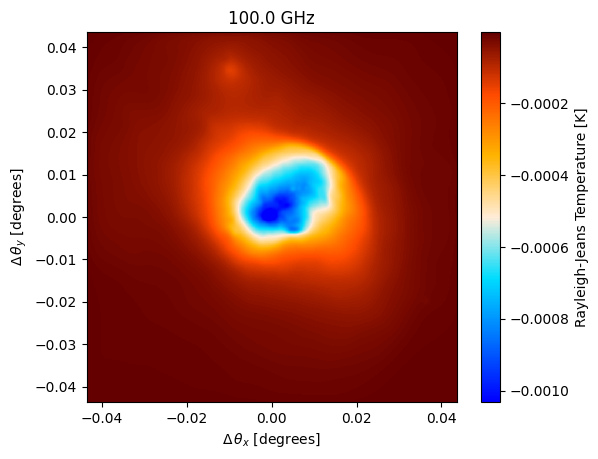

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

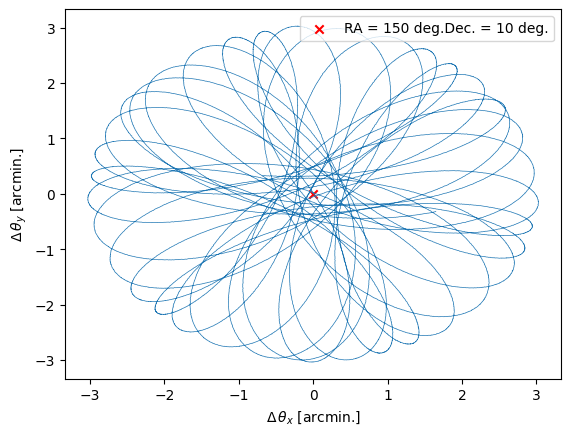

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                      duration=600, # integration time in seconds
                    # duration=60,
                    #   duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-10-17 14:56:36.999 INFO: Initialized base in 1583 ms.
Building atmosphere: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]
2024-10-17 14:56:42.402 INFO: Initialized atmosphere in 5389 ms.
Generating noise: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


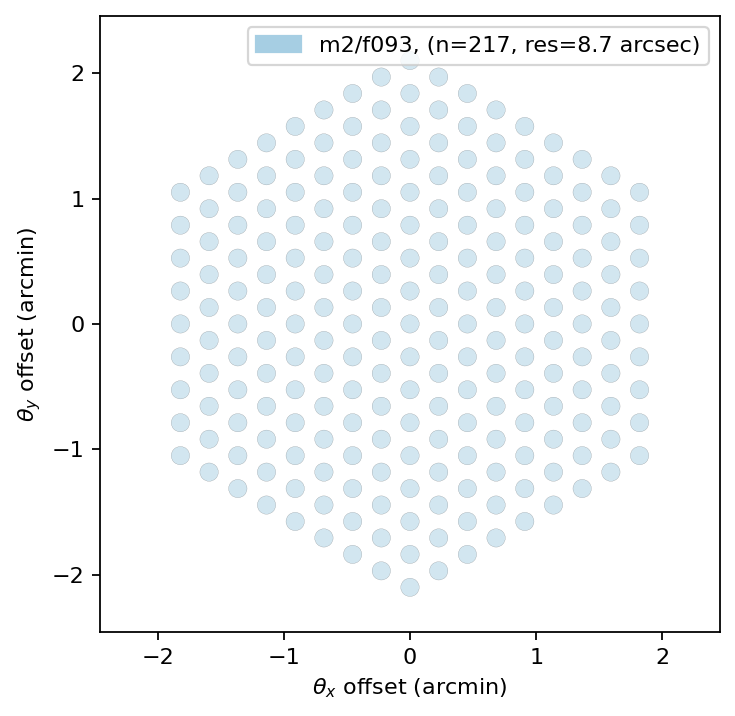

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

dx

array([[-1.96897052e-04, -1.92940898e-04, -1.90028497e-04, ...,
         4.74033520e-04,  4.76302690e-04,  4.79809238e-04],
       [-2.46016100e-04, -2.42060121e-04, -2.39147842e-04, ...,
         4.28686824e-04,  4.30955935e-04,  4.34462275e-04],
       [-1.21706852e-04, -1.17750738e-04, -1.14838365e-04, ...,
         5.49911509e-04,  5.52180670e-04,  5.55687190e-04],
       ...,
       [ 1.20865159e-04,  1.24822740e-04,  1.27736154e-04, ...,
         7.60929055e-04,  7.63198697e-04,  7.66706944e-04],
       [-4.05466244e-04, -4.01508386e-04, -3.98594776e-04, ...,
         2.29783130e-04,  2.32052829e-04,  2.35561278e-04],
       [-7.46276359e-04, -7.42320316e-04, -7.39407993e-04, ...,
        -7.19278171e-05, -6.96587153e-05, -6.61524097e-05]])

Running mapper (m2/f093): 100%|██████████| 1/1 [00:05<00:00,  5.61s/it]


mapdata_truth shape: (1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


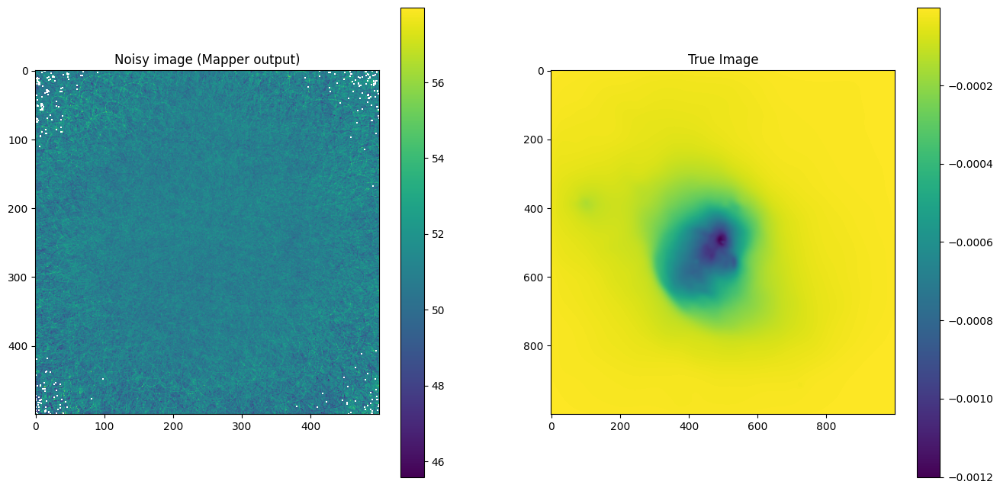

In [5]:
from maria.map.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 0}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-10-17 14:56:56.795 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-17 14:56:56.797 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

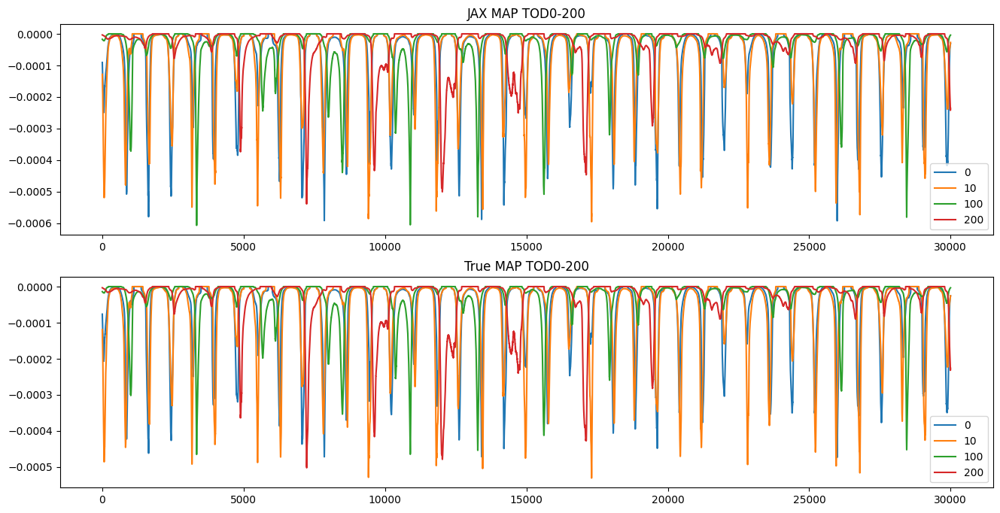

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(2, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.get_field('map').compute())
    im1 = axes[1].plot(tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True MAP TOD0-{i}')
axes[1].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.00025217764742251785


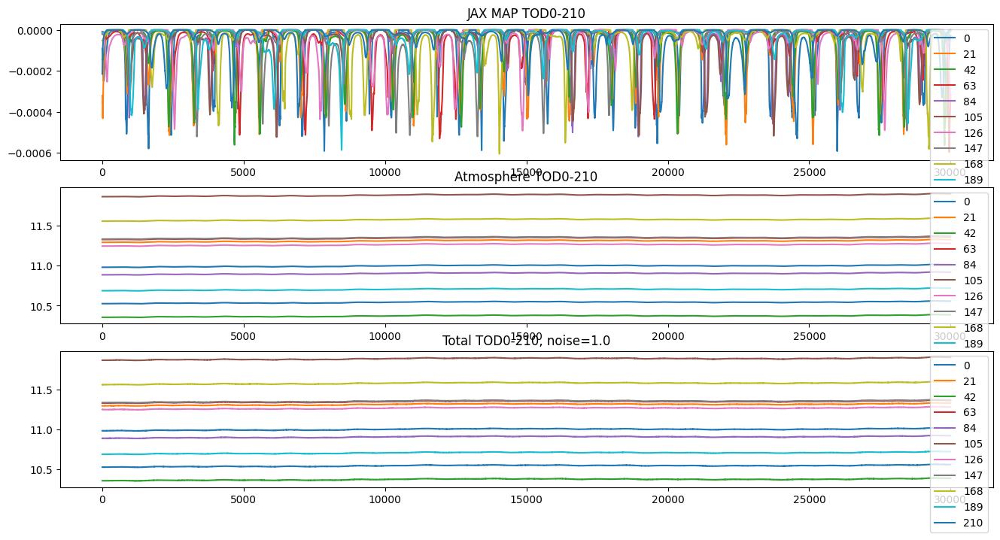

In [8]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
# n = 1
# n = 10
# n = 100
n = jax_tods_map.shape[0]

jax_tods_atmos = tod_truthmap.get_field('atmosphere')
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.get_field('noise')*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos[:n]) 
# # noised_jax_tod[:n] = np.float64(jax_tods_atmos[:n])

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.get_field('noise')*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.get_field('noise').compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10):
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

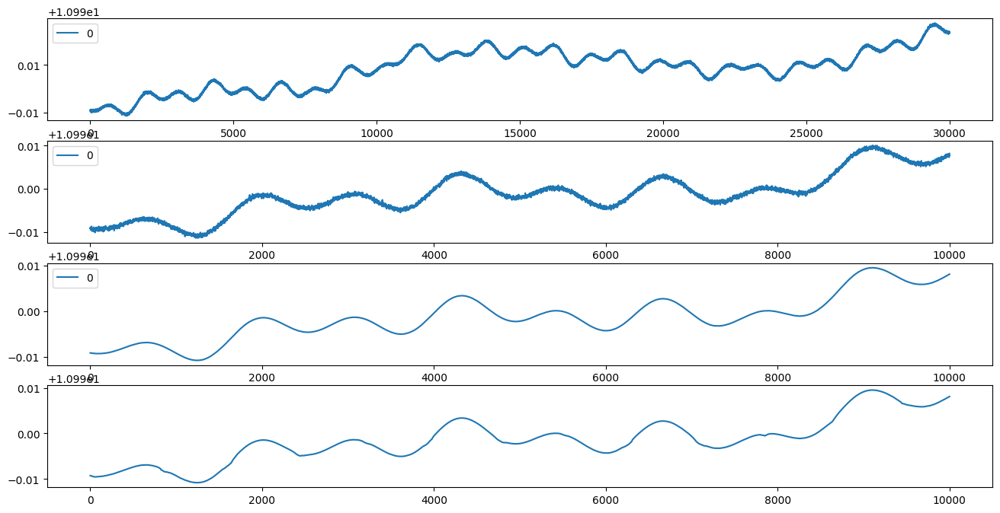

In [9]:
fig, axes = plt.subplots(4, 1, figsize=(16, 8))
for i in range(1):
    axes[0].plot(jax_tods_atmos[i] + np.float64(tod_truthmap.get_field('noise')*noiselevel)[i], label=i)
    axes[1].plot( (jax_tods_atmos[i] + np.float64(tod_truthmap.get_field('noise')*noiselevel)[i])[:10000], label=i)
    axes[2].plot( (jax_tods_atmos[i] )[:10000], label=i)
    axes[3].plot( (jax_tods_atmos[i] + jax_tods_map[i] )[:10000], label=i)
    # axes[3].plot( (jax_tods_map[i] )[:10000], label=i) 

axes[0].legend()
axes[1].legend()
axes[2].legend()

# Next, initialise nifty prior model

Start with the atmosphere TOD model. For this, we need to re-write the CorrelatedFieldMaker:

In [10]:
import jax

import jax.numpy as jnp
import numpy as np
import nifty8.re as jft
import matplotlib.pyplot as plt

from functools import partial
from nifty8.re.correlated_field import Model, RegularCartesianGrid, hartley, HEALPixGrid, get_sht, ShapeWithDtype, random_like

key = jax.random.PRNGKey(42)

In [11]:
class CFM(jft.CorrelatedFieldMaker):
    def __init__(self, prefix):
        super().__init__(prefix)

    def finalize(self, n_fields: int = 0) -> Model:
        """Finishes off the model construction process and returns the
        constructed operator.
        """
        harmonic_transforms = []
        excitation_shape = ()
        for sgrid in self._target_grids:
            sub_shp = None
            sub_shp = sgrid.harmonic_grid.shape
            excitation_shape += sub_shp
            n = len(excitation_shape)
            harmonic_dvol = 1.0 / sgrid.total_volume
            if isinstance(sgrid, RegularCartesianGrid):
                axes = tuple(range(n - len(sub_shp), n))
                # TODO: Generalize to complex
                trafo = partial(hartley, axes=axes)
            elif isinstance(sgrid, HEALPixGrid):
                axis = len(excitation_shape) - 1
                trafo = get_sht(
                    nside=sgrid.nside,
                    axis=axis,
                    lmax=sgrid.harmonic_grid.lmax,
                    mmax=sgrid.harmonic_grid.mmax,
                    nthreads=1,
                )
            harmonic_transforms.append((harmonic_dvol, trafo))

        # Register the parameters for the excitations in harmonic space
        # TODO: actually account for the dtype here
        pfx = self._prefix + "xi"
        if n_fields > 0:
            xi_shape = (n_fields,) + excitation_shape
        else:
            xi_shape = excitation_shape
        self._parameter_tree[pfx] = ShapeWithDtype(xi_shape)

        def outer_harmonic_transform(p):
            harmonic_dvol, ht = harmonic_transforms[0]
            outer = harmonic_dvol * ht(p)
            for harmonic_dvol, ht in harmonic_transforms[1:]:
                outer = harmonic_dvol * ht(outer)
            return outer

        def _mk_expanded_amp(amp, sub_dom):  # Avoid late binding
            def expanded_amp(p):
                return amp(p)[sub_dom.harmonic_grid.power_distributor]

            return expanded_amp

        expanded_amplitudes = []
        namps = self.get_normalized_amplitudes()
        for amp, sgrid in zip(namps, self._target_grids):
            expanded_amplitudes.append(_mk_expanded_amp(amp, sgrid))

        def outer_amplitude(p):
            outer = expanded_amplitudes[0](p)
            for amp in expanded_amplitudes[1:]:
                # NOTE, the order is important here and must match with the
                # excitations
                # TODO, use functions instead and utilize numpy's casting
                outer = jnp.tensordot(outer, amp(p), axes=0)
            return outer

        def correlated_field(p):
            ea = outer_amplitude(p)
            cf_h = self.azm(p) * ea * p[self._prefix + "xi"]
            return self._offset_mean + outer_harmonic_transform(cf_h)
        
        p_dct = {k: 0 if 'xi' in k else None for k in self._parameter_tree}
        cfm_vmap = jax.vmap(correlated_field, in_axes=(p_dct,))

        init = {
            k: partial(random_like, primals=v) for k, v in self._parameter_tree.items()
        }
        cf = Model(cfm_vmap, domain=self._parameter_tree.copy(), init=init)
        cf.normalized_amplitudes = namps
        cf.target_grids = tuple(self._target_grids)
        return cf

In [12]:
# padding_atmos = 2000
padding_atmos = 5000
dims_atmos = ( (jax_tods_atmos.shape[1] + padding_atmos), )
# dims_atmos = ( (jax_tods_atmos.shape[1] - 200 + padding_atmos), )

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0005, 0.001))
# cf_zm_tod = dict(offset_mean=jax_tods_atmos[0].mean().compute(), offset_std=(0.0005, 0.001))
cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.002, 0.001))
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(2e-5, 1e-5))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    # fluctuations=(0.005, 0.003), 
    # fluctuations=(0.001, 0.0005),
    fluctuations=(0.002, 0.001),
    # loglogavgslope=(-3, 0.5), 
    # loglogavgslope=(-2, 0.5), 
    loglogavgslope=(-2.5, 0.5), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
gp_tod = cfm_tod.finalize(n)
gp_tod

# Old: default CFM:
# cfm_tod = jft.CorrelatedFieldMaker("")
# cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
# cfm_tod.add_fluctuations(
#     dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
# )
# # init params for each TOD:
# gps_tods = []
# for i in range(n):
#     cfmi = jft.CorrelatedFieldMaker(f'tod{i} ')
#     # cfmi.set_amplitude_total_offset(**cf_zm_tod)
#     cfmi._azm = cfm_tod._azm
#     cfmi._offset_mean = cfm_tod._offset_mean
#     cfmi._parameter_tree['zeromode'] = jft.ShapeWithDtype(())

#     cfmi._fluctuations.append(cfm_tod._fluctuations[0])
#     cfmi._target_grids.append(cfm_tod._target_grids[0])
#     cfmi._parameter_tree.update(cfm_tod._fluctuations[0].domain)
#     gps_tods.append(cfmi.finalize())
# gps_tods

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x150f64136160>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 35000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x150fb8b0e3e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x150fb8b0e3e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x150fb8b0e3e0>, primals=ShapeWithDtype(shape=(217, 35000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x1

## Now for the map model:

In [13]:
# padding_map = 100
# dims_map = (1000 + padding_map, 1000 + padding_map)
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
# cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-7, 1e-6))
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    # fluctuations=(1e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    # fluctuations=(2e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    fluctuations=(4.5e-5, 2e-5),
    loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

# Define offset NormalPrior:

mean deviation: -1.6078064975991918e-14
deviation std: 0.5206581678602452
offset for n dets: [-0.23164646  0.45916779 -0.85937901 -0.41243415 -0.35861295 -0.76063525
 -0.34290732  1.51168608 -0.77574874  0.15575446  1.02449824  1.30812053
  0.0279478  -0.4889657   0.6703528   0.20846768  0.44027219  0.11248754
  0.39785838  0.13929491  1.0646288   0.08050259 -0.92057849  0.56308653
  0.47390651 -0.24580493  0.06731826 -0.02075901 -0.46885323 -0.17185121
  1.03359713 -0.22144226 -0.37224158 -0.09925144  0.10236148  0.53457016
 -0.24441931  0.59763029 -0.15242722  0.07193069  0.45939705  0.28808025
 -0.85801637  0.27814874 -0.09097537 -0.28238266 -0.12436509 -0.46329649
 -0.75562469 -0.14496932  0.53125505 -0.50678491  0.19065752 -0.37627865
  0.52676621 -0.00231954 -0.10951101  0.19514785 -0.21071532 -0.09806519
  0.46601036 -0.20465855 -0.22128659  0.11549601 -0.81950467  0.45270567
  0.09491521 -0.37439094  0.27706557 -0.02283539  0.41260188 -0.64791692
  0.2976271  -0.20837564 -0.678

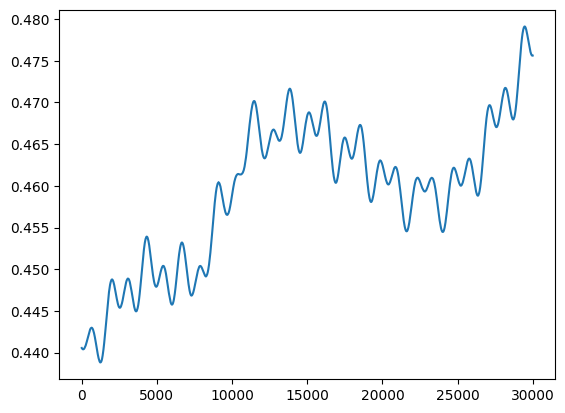

In [14]:
deviation = jax_tods_atmos - jax_tods_atmos.mean()

print("mean deviation:", deviation.mean().compute())
print("deviation std:", deviation.std().compute())

offset_tod = jnp.float64(deviation.mean(axis=1)[:n].compute())
print("offset for n dets:", offset_tod)

plt.plot(deviation[1])

In [15]:
# offset_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# offset_tod = jft.NormalPrior(**offset_dict, name='offset')

# offset_tod

# OLD Signal model:

In [16]:
# class Signal_TOD(jft.Model):
#     def __init__(self, gps_tods, gp_map):
#         self.gps_tods = gps_tods
#         self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         self.gp_map = gp_map
#         super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
    
#     def __call__(self, x):
#         res_tods = jnp.zeros(self.tgt)
#         for i, gp in enumerate(self.gps_tods):
#             res_tods = res_tods.at[i].set(gp(x))
        
#         res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

#         # Only add first n atmosphere tods, otherwise use map
#         modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         return modified_res_map

# signal_response_tod = Signal_TOD(gps_tods, gp_map)

# Using CFM - combined

In [17]:
class Signal_TOD(jft.Model):
    def __init__(self, gp_tod, offset_tod, gp_map):
        self.gp_tod = gp_tod
        self.gp_map = gp_map
        self.offset_tod = offset_tod

        # super().__init__(init = self.gp_tod.init | self.gp_map.init | self.offset_tod.init,
        #                  domain = self.gp_tod.domain | self.gp_map.domain | self.offset_tod.domain)
        super().__init__(init = self.gp_tod.init | self.gp_map.init,
                        domain = self.gp_tod.domain | self.gp_map.domain )


    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] + self.offset_tod(x)[:, jax.numpy.newaxis]
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] + self.offset_tod[:, jax.numpy.newaxis]

        # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        # Only add first n atmosphere tods, otherwise use map
        # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])
        modified_res_map = res_map.at[:n, :].add(res_tods_offset)

        return modified_res_map
    
signal_response_tod = Signal_TOD(gp_tod, offset_tod, gp_map)

# map-only:

In [18]:
# class Signal_TOD(jft.Model):
#     def __init__(self, gp_map):
#         self.gp_map = gp_map

#         # super().__init__(init = self.gp_tod.init | self.gp_map.init | self.offset_tod.init,
#         #                  domain = self.gp_tod.domain | self.gp_map.domain | self.offset_tod.domain)
#         super().__init__(init = self.gp_map.init,
#                         domain = self.gp_map.domain )


#     def __call__(self, x):
#         res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

#         return res_map
    
# signal_response_tod = Signal_TOD(gp_map)

# CFM - TOD

In [19]:
# class Signal_TOD(jft.Model):
#     def __init__(self, gp_tod):
#         self.gp_tod = gp_tod
#         super().__init__(init = self.gp_tod.init, domain = self.gp_tod.domain )
    
#     def __call__(self, x):
#         x_tod = {k: x[k] for k in x if 'map' not in k}
#         res_tods = self.gp_tod(x_tod)
#         # res_tods = self.gp_tod(x)

#         return res_tods[:, padding_atmos//2:-padding_atmos//2]

# signal_response_tod = Signal_TOD(gp_tod)

In [20]:
# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
print(noised_jax_tod.shape)
# truth = noised_jax_tod[:, 100:-100]
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(217, 30000)


In [21]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 35000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'cfmapax1fluctuations': functools.partial(<function random_like at 0x150fb8b0e3e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'cfmapax1loglogavgslope': functools.partial(<function random_like at 0x150

# Draw Prior sample

(217, 30000)


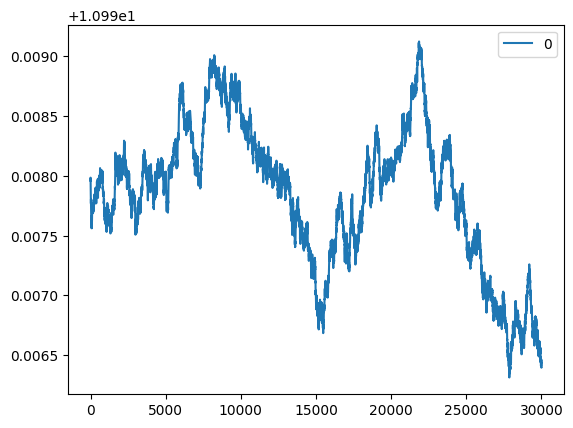

In [22]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
# for i in range(0, n, n//10):
for i in [0]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [23]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:6.675915e+03 ➽:8.595006e+02
M: Iteration 1 ⛰:+2.159583e+09 Δ⛰:1.948256e+09
M: →:0.125 ↺:False #∇²:12 |↘|:2.309325e+03 ➽:8.595006e+02
M: Iteration 2 ⛰:+2.042466e+09 Δ⛰:1.171171e+08
M: →:1.0 ↺:False #∇²:18 |↘|:1.830656e+03 ➽:8.595006e+02
M: Iteration 3 ⛰:+1.910217e+09 Δ⛰:1.322486e+08
M: →:1.0 ↺:False #∇²:24 |↘|:3.628642e+03 ➽:8.595006e+02
M: Iteration 4 ⛰:+2.684499e+08 Δ⛰:1.641767e+09
M: →:1.0 ↺:False #∇²:30 |↘|:1.852220e+03 ➽:8.595006e+02
M: Iteration 5 ⛰:+2.232305e+08 Δ⛰:4.521940e+07
M: →:1.0 ↺:False #∇²:38 |↘|:8.041147e+03 ➽:8.595006e+02
M: Iteration 6 ⛰:+1.765391e+08 Δ⛰:4.669140e+07
M: →:1.0 ↺:False #∇²:44 |↘|:4.590676e+02 ➽:8.595006e+02
M: Iteration 7 ⛰:+1.520220e+08 Δ⛰:2.451715e+07
OPTIMIZE_KL: Iteration 0001 ⛰:+1.5202e+08
OPTIMIZE_KL: #(KL minimization steps) 7
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 4.5e+01±     0.0, avg:    +0.36±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'r

In [ ]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(5.8103943, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-0.87226358, dtype=float64),
	 'cfmapxi': Array([[ -1.03486817,   7.506903  ,   6.84117561, ..., -14.40640617,
	         -7.07633132,  -7.62098494],
	       [ -2.56981632,  -0.48146628,   0.85441251, ...,   0.31273234,
	         -0.81329788,  -0.40612575],
	       [ -3.36733334,  -0.74869897,   0.77271903, ...,   0.30894848,
	         -0.38840281,  -1.29082491],
	       ...,
	       [  6.40759908,  -0.97193714,  -1.43847117, ...,  -0.30296601,
	          0.51410184,  -0.55386262],
	       [  2.07189678,   0.79606278,  -0.6575422 , ...,   1.26193241,
	          0.1461447 ,  -0.23439363],
	       [  3.26582232,  -0.14187781,   1.30441298, ...,   1.50968099,
	         -0.49346525,  -0.30186678]], dtype=float64),
	 'cfmapzeromode': Array(-0.4087285, dtype=float64),
	 'combcf tod fluctuations': Array(0.52155926, dtype=float64),
	 'combcf tod loglogavgslope': Array(1.12743324, dtype=float64),

In [37]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    # # NEW model:
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['combcf tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['combcf tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['combcf zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")
    # OLD model:
    # print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    # print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    # print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")

    # offset per detector:
    # offset_results = jft.NormalPrior(**offset_dict)(samples.pos['offset'])
    # print(f"\toffset: ({offset_results.mean()}, {offset_results.std()}), {offset_dict['mean']}, {offset_dict['std']}")
    # # residual offset:
    # offset_residuals = offset_results - jnp.float64(deviation.mean(axis=1)[:n].compute())
    # print(f"\toffset residuals: ({offset_residuals.mean()}, {offset_residuals.std()})")

    # If custom zeromode per TOD:
    # for i in range(n):
    #     test = samples.pos[f"tod{i} zeromode"]
    #     print(f"tod{i} zeromode: {jft.LogNormalPrior(cf_zm_tod['offset_mean'], cf_zm_tod['offset_std'][0])(test)}, {cf_zm_tod['offset_mean']}, {cf_zm_tod['offset_std'][0]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.003161262037585366, 0.002, 0.001
	loglogvarslope: -2.842047736369864, -2.5, 0.5
	zeromode std (LogNormal): 0.00011776495069513501, 0.002, 0.001
map:
	fluctuations: 3.205845523930888e-05, 4.5e-05, 2e-05
	loglogvarslope: -3.443601445722148, -2.5, 0.5
	zeromode std (LogNormal): 1.0532265761380043e-09, 1e-08, 1e-07


(217, 30000)


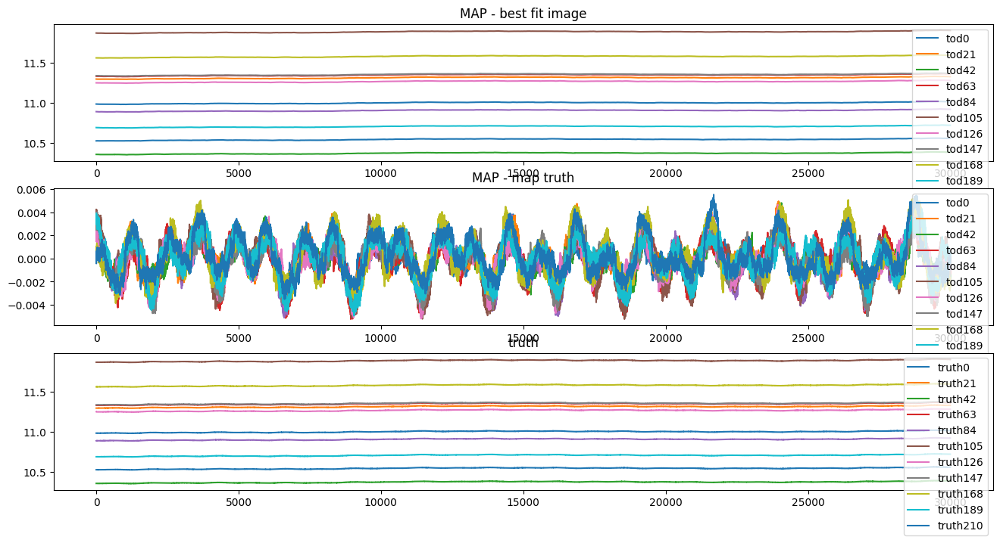

In [26]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
for i in range(0, n, n//10):
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

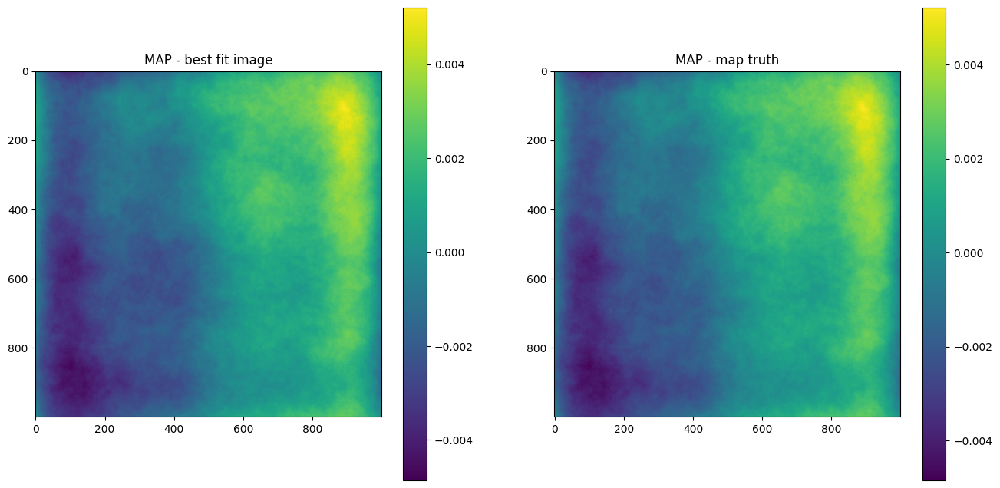

In [27]:
# plot maximum of posterior (mode)
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [28]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+1.3299e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+7.3142e+07 Δ⛰:5.9843e+07 ➽:8.5950e+01
SL: Iteration 2 ⛰:+5.1614e+07 Δ⛰:2.1528e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+7.7764e+06 Δ⛰:4.3838e+07 ➽:8.5950e+01
SL: Iteration 4 ⛰:-1.0621e+06 Δ⛰:8.8385e+06 ➽:8.5950e+01
SL: Iteration 5 ⛰:-1.4524e+06 Δ⛰:3.9027e+05 ➽:8.5950e+01
SL: Iteration 6 ⛰:-1.8511e+06 Δ⛰:3.9869e+05 ➽:8.5950e+01
SL: Iteration 7 ⛰:-2.4358e+06 Δ⛰:5.8475e+05 ➽:8.5950e+01
SL: Iteration 8 ⛰:-2.6994e+06 Δ⛰:2.6356e+05 ➽:8.5950e+01
SL: Iteration 9 ⛰:-3.1988e+06 Δ⛰:4.9939e+05 ➽:8.5950e+01
SL: Iteration 10 ⛰:-3.4002e+06 Δ⛰:2.0144e+05 ➽:8.5950e+01
SL: Iteration 11 ⛰:-3.7330e+06 Δ⛰:3.3278e+05 ➽:8.5950e+01
SL: Iteration 12 ⛰:-3.7358e+06 Δ⛰:2.8552e+03 ➽:8.5950e+01
SL: Iteration 13 ⛰:-3.7487e+06 Δ⛰:1.2885e+04 ➽:8.5950e+01
SL: Iteration 14 ⛰:-3.8101e+06 Δ⛰:6.1389e+04 ➽:8.5950e+01
SL: Iteration 15 ⛰:-3.9287e+06 Δ⛰:1.1863e+05 ➽:8.5950e+01
SL: Iteration 16 ⛰:-3.9358e+06 Δ⛰:7.0632e+03 ➽:8.5950e+01
SL: 

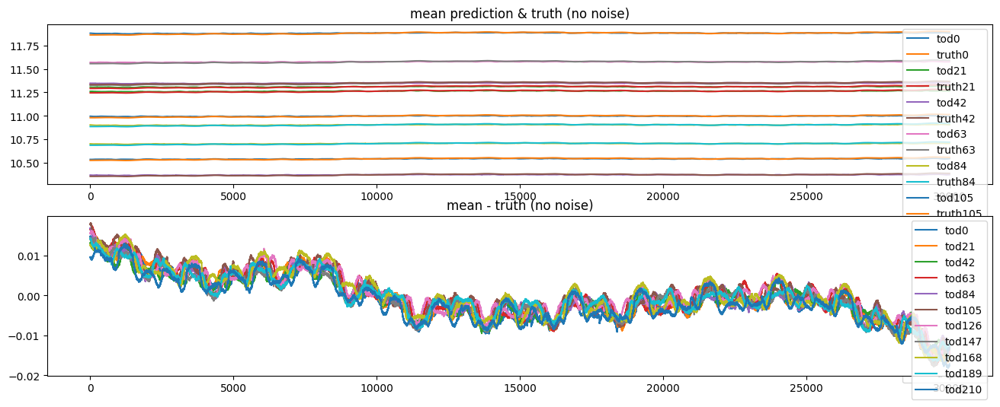

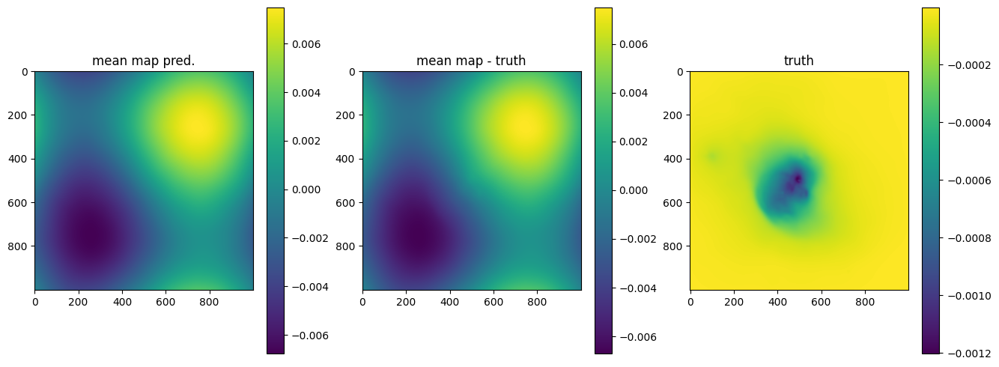

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+4.0620e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+5.2667e+07 Δ⛰:3.5353e+08 ➽:8.5950e+01
SL: Iteration 2 ⛰:+3.7507e+07 Δ⛰:1.5160e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+3.1888e+07 Δ⛰:5.6184e+06 ➽:8.5950e+01
SL: Iteration 4 ⛰:+3.0161e+07 Δ⛰:1.7270e+06 ➽:8.5950e+01
SL: Iteration 5 ⛰:+1.1445e+07 Δ⛰:1.8716e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+9.7708e+06 Δ⛰:1.6743e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+4.8516e+06 Δ⛰:4.9192e+06 ➽:8.5950e+01
SL: Iteration 8 ⛰:+4.8139e+06 Δ⛰:3.7760e+04 ➽:8.5950e+01
SL: Iteration 9 ⛰:+4.3428e+06 Δ⛰:4.7107e+05 ➽:8.5950e+01
SL: Iteration 10 ⛰:+3.6508e+06 Δ⛰:6.9198e+05 ➽:8.5950e+01
SL: Iteration 11 ⛰:+3.6404e+06 Δ⛰:1.0410e+04 ➽:8.5950e+01
SL: Iteration 12 ⛰:+3.1430e+06 Δ⛰:4.9744e+05 ➽:8.5950e+01
SL: Iteration 13 ⛰:+2.3433e+06 Δ⛰:7.9969e+05 ➽:8.5950e+01
SL: Iteration 14 ⛰:+2.3425e+06 Δ⛰:8.2973e+02 ➽:8.5950e+01
SL: Iteration 15 ⛰:+2.2726e+06 Δ⛰:6.9864e+04 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.6846e+06 Δ⛰:5.8803e+05 ➽:8.5950e+01
SL: 

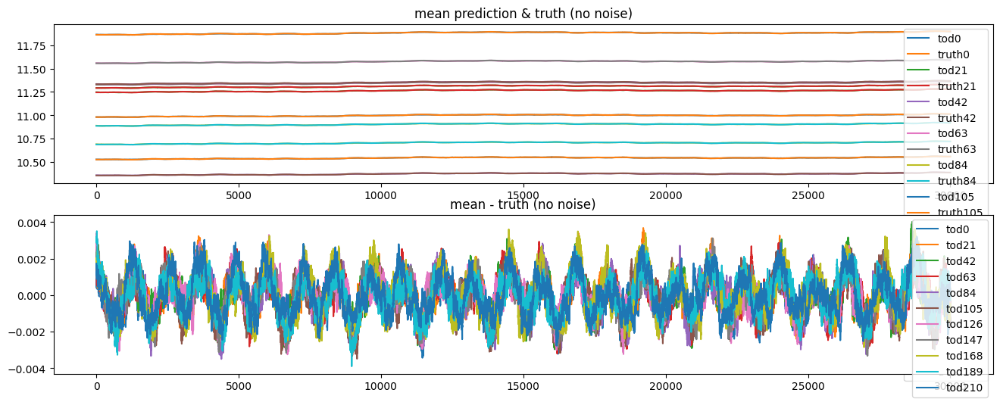

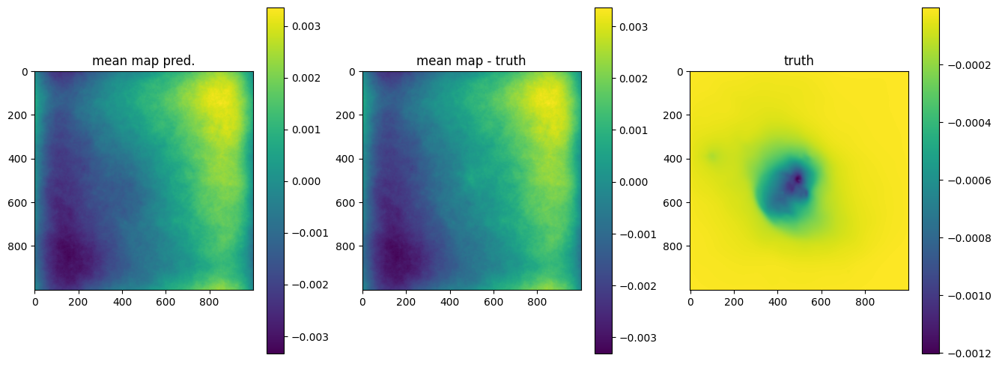

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+1.7348e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+1.5213e+08 Δ⛰:2.1351e+07 ➽:8.5950e+01
SL: Iteration 2 ⛰:+1.4442e+08 Δ⛰:7.7050e+06 ➽:8.5950e+01
SL: Iteration 3 ⛰:+1.3437e+08 Δ⛰:1.0056e+07 ➽:8.5950e+01
SL: Iteration 4 ⛰:+5.6569e+07 Δ⛰:7.7800e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+5.1871e+07 Δ⛰:4.6973e+06 ➽:8.5950e+01
SL: Iteration 6 ⛰:+3.4671e+07 Δ⛰:1.7200e+07 ➽:8.5950e+01
SL: Iteration 7 ⛰:+3.4668e+07 Δ⛰:2.2635e+03 ➽:8.5950e+01
SL: Iteration 8 ⛰:+2.7101e+07 Δ⛰:7.5677e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+2.6189e+07 Δ⛰:9.1174e+05 ➽:8.5950e+01
SL: Iteration 10 ⛰:+1.9295e+07 Δ⛰:6.8936e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+1.6157e+07 Δ⛰:3.1389e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+1.3855e+07 Δ⛰:2.3011e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+1.3846e+07 Δ⛰:9.2170e+03 ➽:8.5950e+01
SL: Iteration 14 ⛰:+1.2528e+07 Δ⛰:1.3185e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.2468e+07 Δ⛰:5.9531e+04 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.1503e+07 Δ⛰:9.6471e+05 ➽:8.5950e+01
SL: 

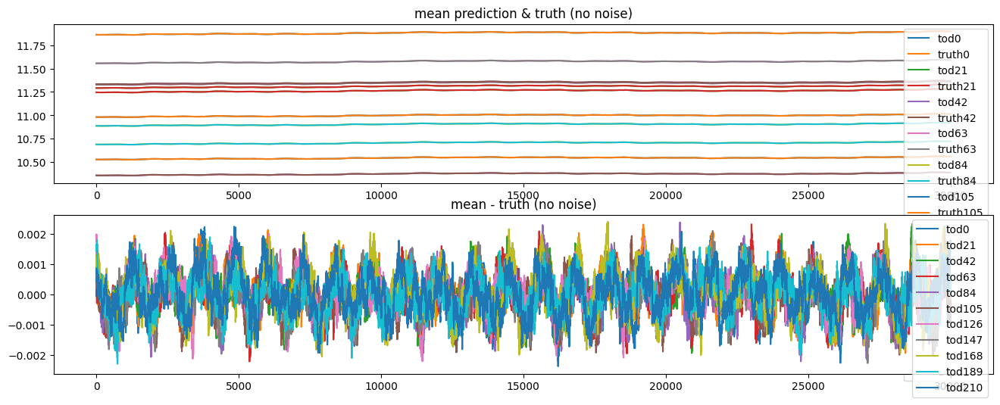

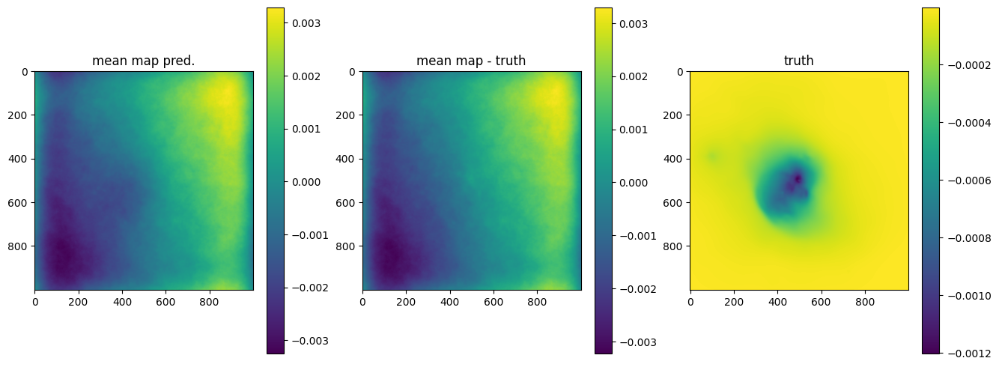

OPTIMIZE_KL: Starting 0004
SL: Iteration 0 ⛰:+5.1996e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+3.5848e+08 Δ⛰:1.6147e+08 ➽:8.5950e+01
SL: Iteration 2 ⛰:+1.6794e+08 Δ⛰:1.9054e+08 ➽:8.5950e+01
SL: Iteration 3 ⛰:+1.3002e+08 Δ⛰:3.7919e+07 ➽:8.5950e+01
SL: Iteration 4 ⛰:+6.3593e+07 Δ⛰:6.6425e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+5.4815e+07 Δ⛰:8.7784e+06 ➽:8.5950e+01
SL: Iteration 6 ⛰:+3.6351e+07 Δ⛰:1.8463e+07 ➽:8.5950e+01
SL: Iteration 7 ⛰:+3.6338e+07 Δ⛰:1.3795e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+2.8498e+07 Δ⛰:7.8391e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+2.8187e+07 Δ⛰:3.1161e+05 ➽:8.5950e+01
SL: Iteration 10 ⛰:+1.9277e+07 Δ⛰:8.9103e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+1.6451e+07 Δ⛰:2.8252e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+1.3238e+07 Δ⛰:3.2136e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+1.3081e+07 Δ⛰:1.5682e+05 ➽:8.5950e+01
SL: Iteration 14 ⛰:+1.1726e+07 Δ⛰:1.3546e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.0159e+07 Δ⛰:1.5678e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.0116e+07 Δ⛰:4.3019e+04 ➽:8.5950e+01
SL: 

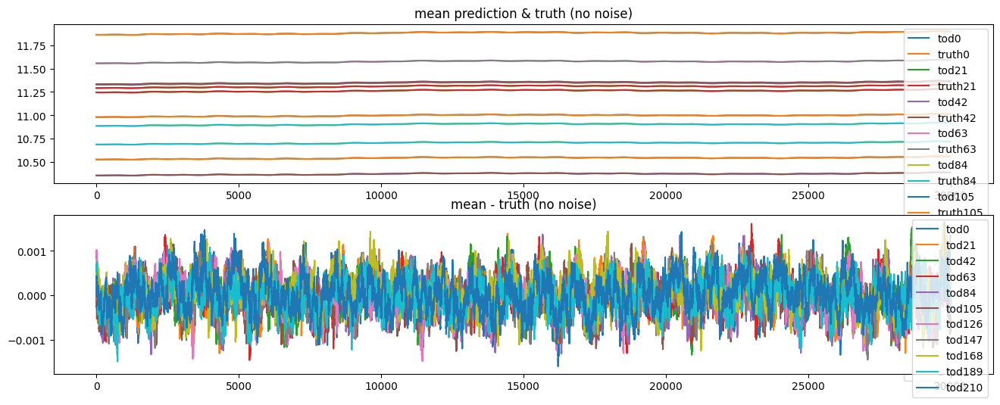

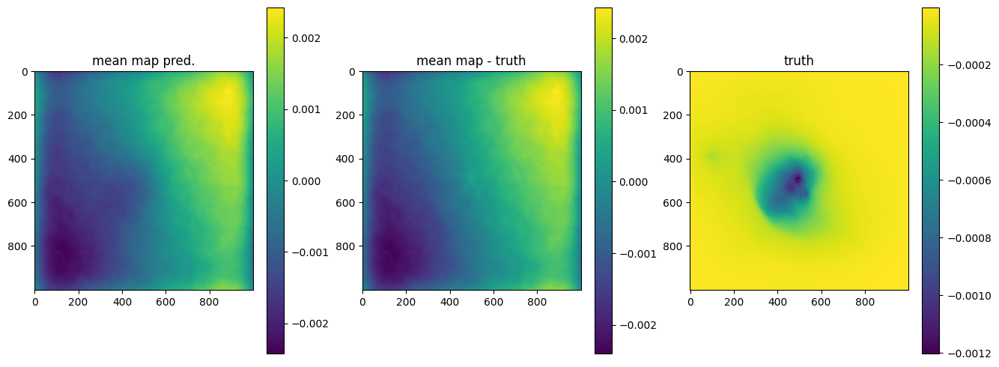

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+4.3675e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+3.4097e+08 Δ⛰:9.5780e+07 ➽:8.5950e+01
SL: Iteration 2 ⛰:+2.5515e+08 Δ⛰:8.5820e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+1.7172e+08 Δ⛰:8.3433e+07 ➽:8.5950e+01
SL: Iteration 4 ⛰:+7.8448e+07 Δ⛰:9.3273e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+4.8634e+07 Δ⛰:2.9814e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+3.8926e+07 Δ⛰:9.7078e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+3.8903e+07 Δ⛰:2.2935e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+3.2154e+07 Δ⛰:6.7496e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+2.9714e+07 Δ⛰:2.4401e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+2.0049e+07 Δ⛰:9.6650e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+1.5569e+07 Δ⛰:4.4799e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+1.3532e+07 Δ⛰:2.0365e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+1.3505e+07 Δ⛰:2.7664e+04 ➽:8.5950e+01
SL: Iteration 14 ⛰:+1.0745e+07 Δ⛰:2.7599e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.0012e+07 Δ⛰:7.3276e+05 ➽:8.5950e+01
SL: Iteration 16 ⛰:+9.9655e+06 Δ⛰:4.6631e+04 ➽:8.5950e+01
SL: 

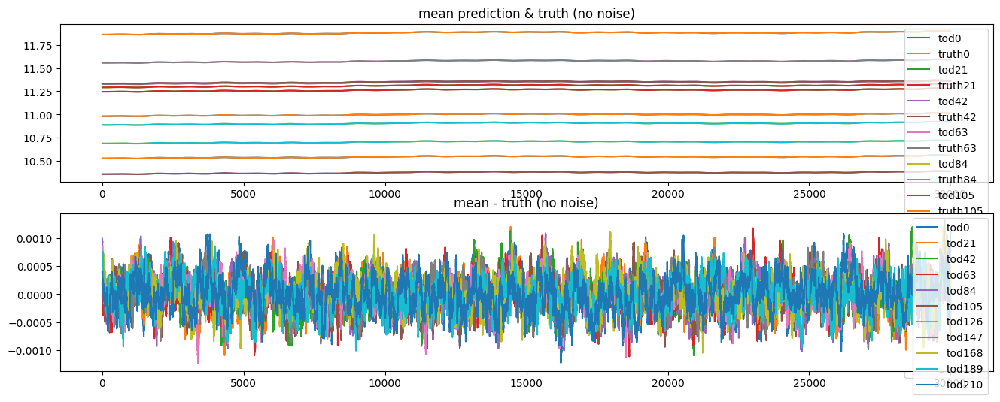

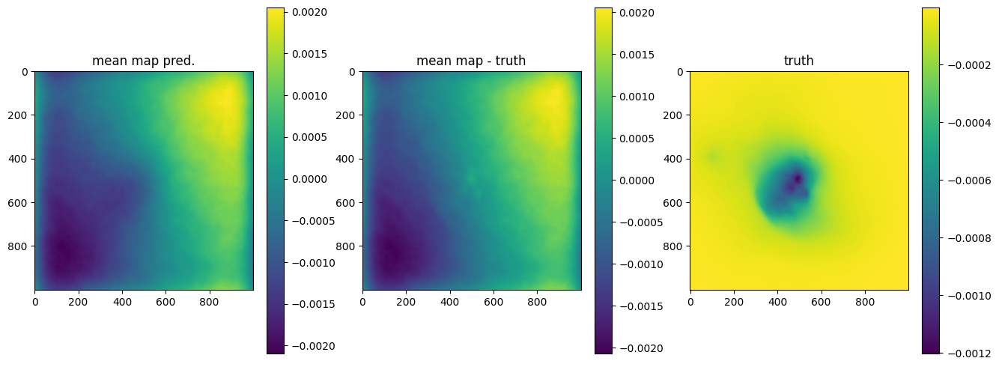

OPTIMIZE_KL: Starting 0006
SL: Iteration 0 ⛰:+2.6731e+09 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+3.9935e+08 Δ⛰:2.2738e+09 ➽:8.5950e+01
SL: Iteration 2 ⛰:+3.3334e+08 Δ⛰:6.6003e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+9.7122e+07 Δ⛰:2.3622e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+7.7348e+07 Δ⛰:1.9773e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+5.7067e+07 Δ⛰:2.0281e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+4.2040e+07 Δ⛰:1.5027e+07 ➽:8.5950e+01
SL: Iteration 7 ⛰:+4.2027e+07 Δ⛰:1.2402e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+3.5671e+07 Δ⛰:6.3568e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+2.8498e+07 Δ⛰:7.1724e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+2.2010e+07 Δ⛰:6.4885e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+1.7514e+07 Δ⛰:4.4955e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+1.3636e+07 Δ⛰:3.8777e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+1.3564e+07 Δ⛰:7.2018e+04 ➽:8.5950e+01
SL: Iteration 14 ⛰:+1.1992e+07 Δ⛰:1.5722e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.0265e+07 Δ⛰:1.7269e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.0004e+07 Δ⛰:2.6155e+05 ➽:8.5950e+01
SL: 

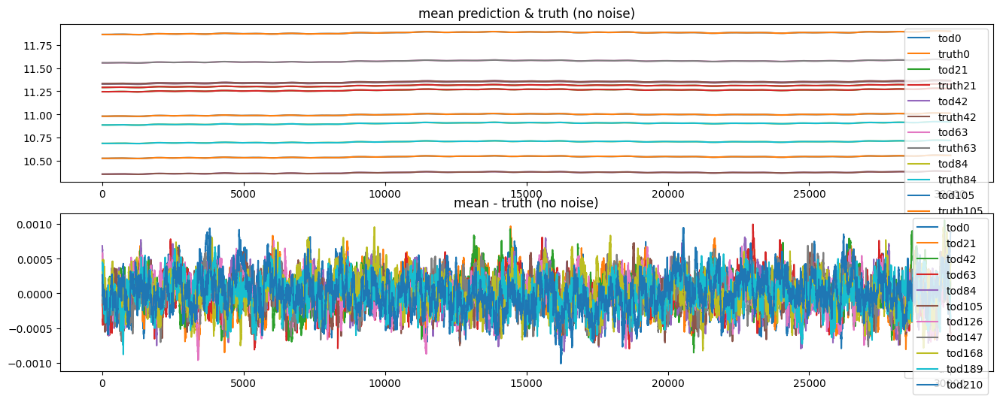

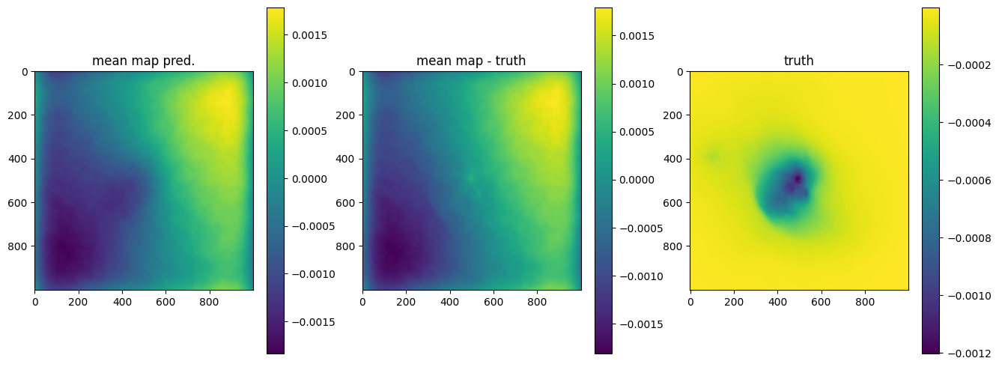

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+6.7835e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+5.9189e+08 Δ⛰:8.6465e+07 ➽:8.5950e+01
SL: Iteration 2 ⛰:+5.0702e+08 Δ⛰:8.4871e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+1.2195e+08 Δ⛰:3.8507e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+7.8711e+07 Δ⛰:4.3237e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+5.4158e+07 Δ⛰:2.4552e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+4.3102e+07 Δ⛰:1.1056e+07 ➽:8.5950e+01
SL: Iteration 7 ⛰:+4.3017e+07 Δ⛰:8.5708e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+2.5212e+07 Δ⛰:1.7805e+07 ➽:8.5950e+01
SL: Iteration 9 ⛰:+2.4445e+07 Δ⛰:7.6694e+05 ➽:8.5950e+01
SL: Iteration 10 ⛰:+2.2929e+07 Δ⛰:1.5164e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+1.9133e+07 Δ⛰:3.7956e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+1.6439e+07 Δ⛰:2.6939e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+1.6200e+07 Δ⛰:2.3886e+05 ➽:8.5950e+01
SL: Iteration 14 ⛰:+1.3056e+07 Δ⛰:3.1441e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.1577e+07 Δ⛰:1.4791e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.0370e+07 Δ⛰:1.2076e+06 ➽:8.5950e+01
SL: 

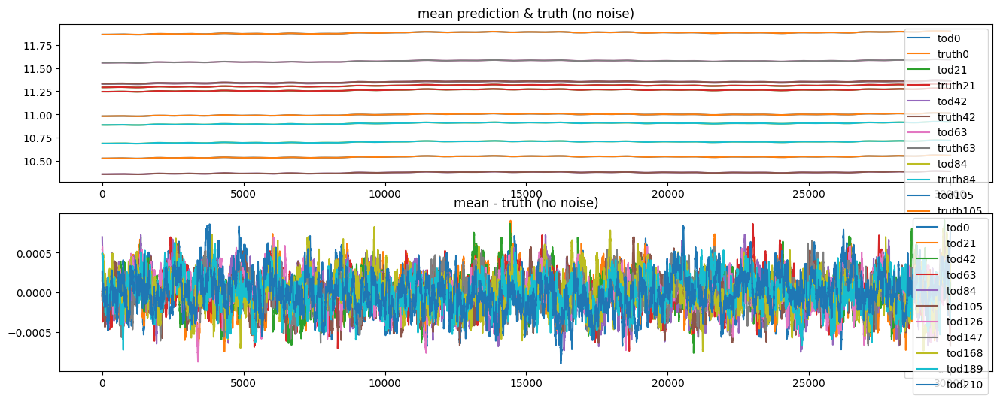

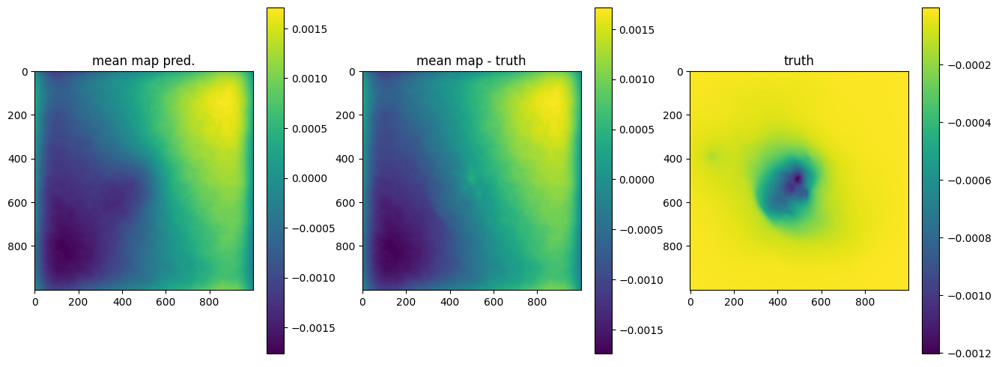

OPTIMIZE_KL: Starting 0008
SL: Iteration 0 ⛰:+6.2061e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+5.6586e+08 Δ⛰:5.4747e+07 ➽:8.5950e+01
SL: Iteration 2 ⛰:+5.5431e+08 Δ⛰:1.1546e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+1.3400e+08 Δ⛰:4.2032e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+8.9263e+07 Δ⛰:4.4733e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+5.0116e+07 Δ⛰:3.9147e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+4.5134e+07 Δ⛰:4.9816e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+4.5117e+07 Δ⛰:1.7471e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+2.9044e+07 Δ⛰:1.6073e+07 ➽:8.5950e+01
SL: Iteration 9 ⛰:+2.5085e+07 Δ⛰:3.9590e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+2.5050e+07 Δ⛰:3.4623e+04 ➽:8.5950e+01
SL: Iteration 11 ⛰:+2.0549e+07 Δ⛰:4.5011e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+1.7228e+07 Δ⛰:3.3208e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+1.7158e+07 Δ⛰:7.0445e+04 ➽:8.5950e+01
SL: Iteration 14 ⛰:+1.2842e+07 Δ⛰:4.3162e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.1554e+07 Δ⛰:1.2878e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.0648e+07 Δ⛰:9.0611e+05 ➽:8.5950e+01
SL: 

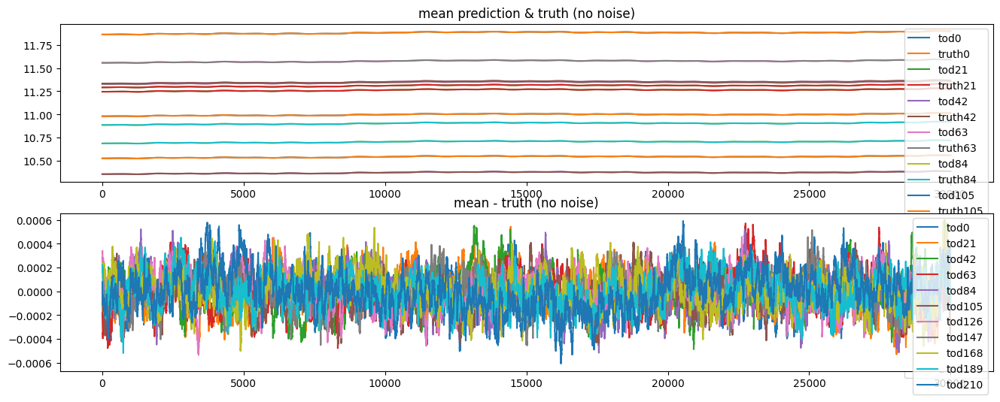

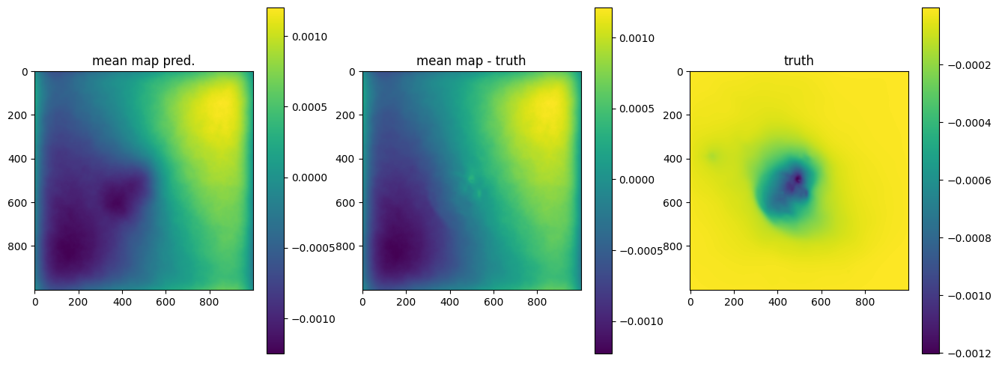

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+6.9891e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+5.9448e+08 Δ⛰:1.0443e+08 ➽:8.5950e+01
SL: Iteration 2 ⛰:+4.9175e+08 Δ⛰:1.0273e+08 ➽:8.5950e+01
SL: Iteration 3 ⛰:+1.0348e+08 Δ⛰:3.8827e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+6.8763e+07 Δ⛰:3.4720e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+3.9717e+07 Δ⛰:2.9046e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+3.1967e+07 Δ⛰:7.7506e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+3.1765e+07 Δ⛰:2.0208e+05 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.7487e+07 Δ⛰:1.4278e+07 ➽:8.5950e+01
SL: Iteration 9 ⛰:+1.7454e+07 Δ⛰:3.2880e+04 ➽:8.5950e+01
SL: Iteration 10 ⛰:+1.5515e+07 Δ⛰:1.9383e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+1.2299e+07 Δ⛰:3.2165e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+1.0979e+07 Δ⛰:1.3198e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+9.0746e+06 Δ⛰:1.9044e+06 ➽:8.5950e+01
SL: Iteration 14 ⛰:+7.9248e+06 Δ⛰:1.1498e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+6.6654e+06 Δ⛰:1.2594e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+5.9731e+06 Δ⛰:6.9236e+05 ➽:8.5950e+01
SL: 

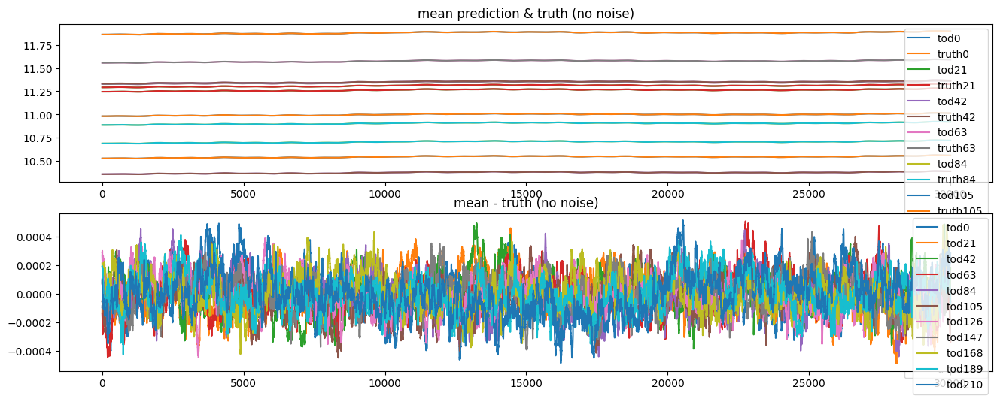

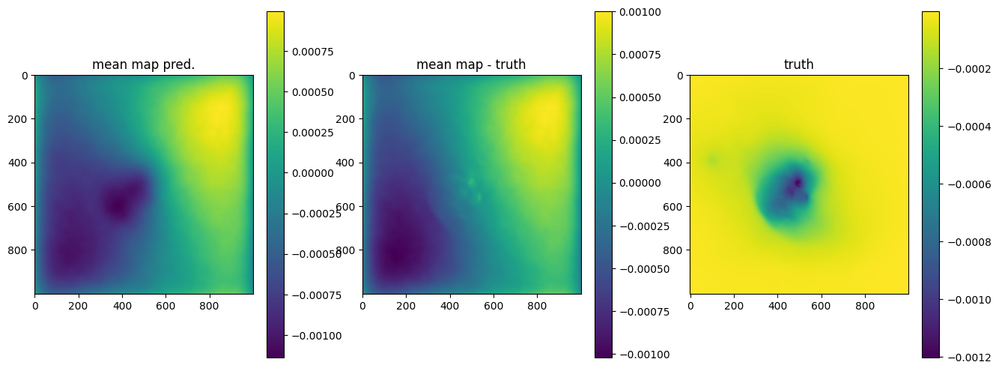

OPTIMIZE_KL: Starting 0010
SL: Iteration 0 ⛰:+1.2159e+09 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+6.5414e+08 Δ⛰:5.6173e+08 ➽:8.5950e+01
SL: Iteration 2 ⛰:+5.8195e+08 Δ⛰:7.2196e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+1.2188e+08 Δ⛰:4.6007e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+7.9640e+07 Δ⛰:4.2240e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+3.9093e+07 Δ⛰:4.0546e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+2.2593e+07 Δ⛰:1.6500e+07 ➽:8.5950e+01
SL: Iteration 7 ⛰:+2.2579e+07 Δ⛰:1.4357e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.9095e+07 Δ⛰:3.4834e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+1.6717e+07 Δ⛰:2.3786e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+1.6370e+07 Δ⛰:3.4619e+05 ➽:8.5950e+01
SL: Iteration 11 ⛰:+1.4410e+07 Δ⛰:1.9608e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+1.1479e+07 Δ⛰:2.9311e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+1.1087e+07 Δ⛰:3.9149e+05 ➽:8.5950e+01
SL: Iteration 14 ⛰:+9.5865e+06 Δ⛰:1.5006e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+7.9787e+06 Δ⛰:1.6078e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+6.1555e+06 Δ⛰:1.8232e+06 ➽:8.5950e+01
SL: 

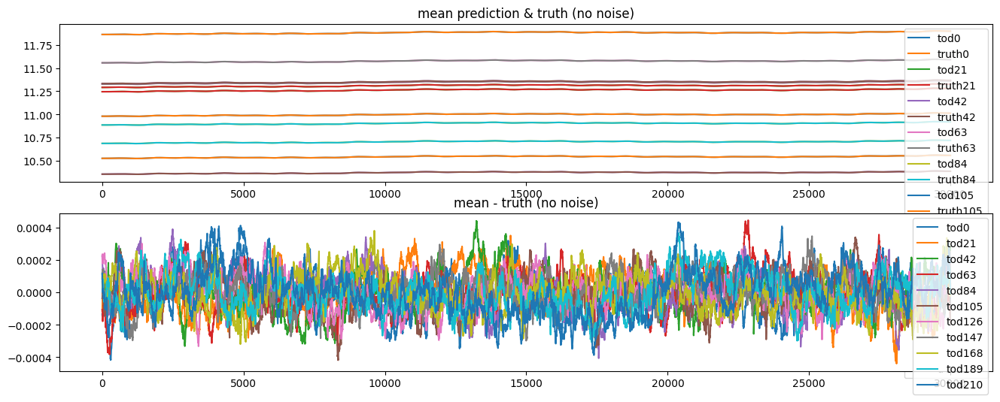

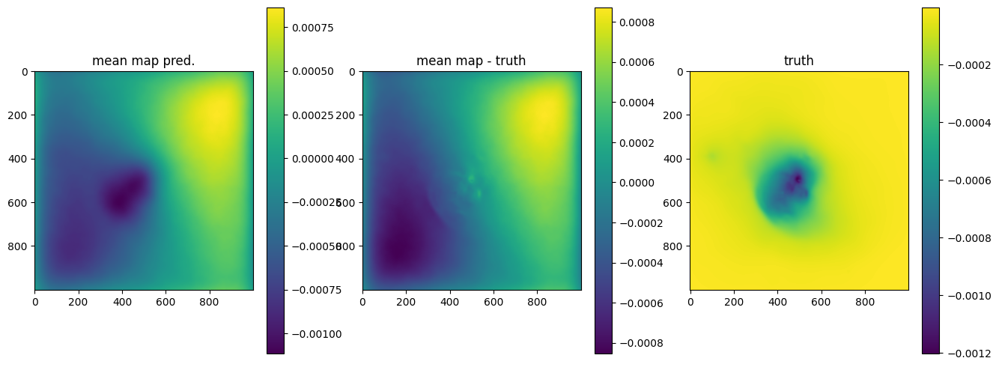

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+1.6860e+09 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+5.5198e+08 Δ⛰:1.1340e+09 ➽:8.5950e+01
SL: Iteration 2 ⛰:+4.5481e+08 Δ⛰:9.7161e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+8.5671e+07 Δ⛰:3.6914e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+5.7443e+07 Δ⛰:2.8228e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+2.5963e+07 Δ⛰:3.1480e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+2.2940e+07 Δ⛰:3.0234e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+2.2934e+07 Δ⛰:6.2229e+03 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.2338e+07 Δ⛰:1.0596e+07 ➽:8.5950e+01
SL: Iteration 9 ⛰:+1.2282e+07 Δ⛰:5.5717e+04 ➽:8.5950e+01
SL: Iteration 10 ⛰:+9.9557e+06 Δ⛰:2.3266e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+8.4097e+06 Δ⛰:1.5460e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+6.7361e+06 Δ⛰:1.6736e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+6.7077e+06 Δ⛰:2.8431e+04 ➽:8.5950e+01
SL: Iteration 14 ⛰:+5.9220e+06 Δ⛰:7.8568e+05 ➽:8.5950e+01
SL: Iteration 15 ⛰:+4.3860e+06 Δ⛰:1.5360e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+3.1978e+06 Δ⛰:1.1882e+06 ➽:8.5950e+01
SL: 

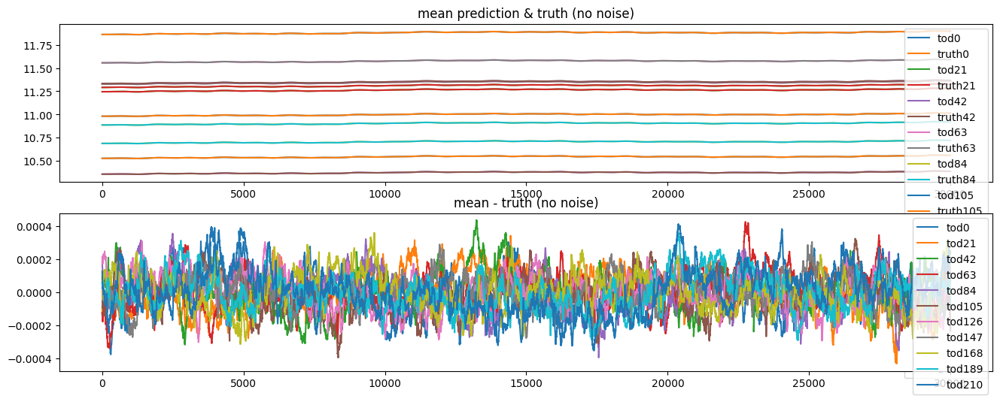

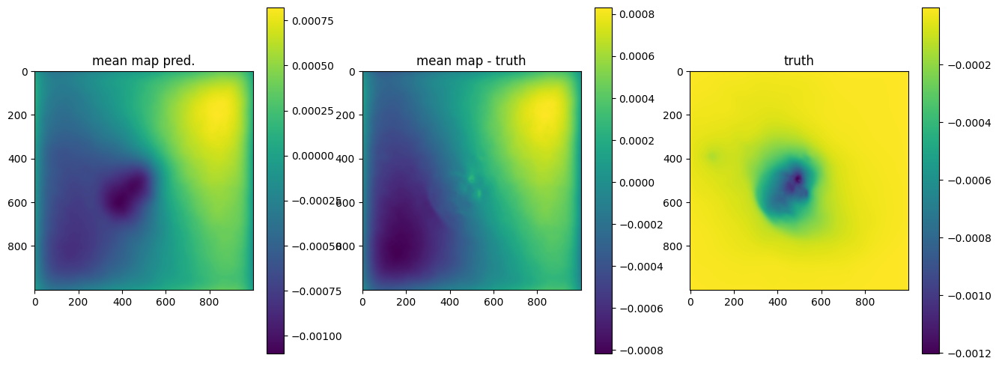

OPTIMIZE_KL: Starting 0012
SL: Iteration 0 ⛰:+1.3856e+09 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+6.2896e+08 Δ⛰:7.5667e+08 ➽:8.5950e+01
SL: Iteration 2 ⛰:+6.1224e+08 Δ⛰:1.6724e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+1.1269e+08 Δ⛰:4.9955e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+7.5809e+07 Δ⛰:3.6876e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+3.0227e+07 Δ⛰:4.5582e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+2.5464e+07 Δ⛰:4.7636e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+2.5424e+07 Δ⛰:3.9927e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.5719e+07 Δ⛰:9.7048e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+1.2295e+07 Δ⛰:3.4236e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+1.2267e+07 Δ⛰:2.8344e+04 ➽:8.5950e+01
SL: Iteration 11 ⛰:+1.0519e+07 Δ⛰:1.7481e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+8.1420e+06 Δ⛰:2.3770e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+8.1403e+06 Δ⛰:1.7904e+03 ➽:8.5950e+01
SL: Iteration 14 ⛰:+7.3122e+06 Δ⛰:8.2802e+05 ➽:8.5950e+01
SL: Iteration 15 ⛰:+5.1804e+06 Δ⛰:2.1319e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+3.7401e+06 Δ⛰:1.4403e+06 ➽:8.5950e+01
SL: 

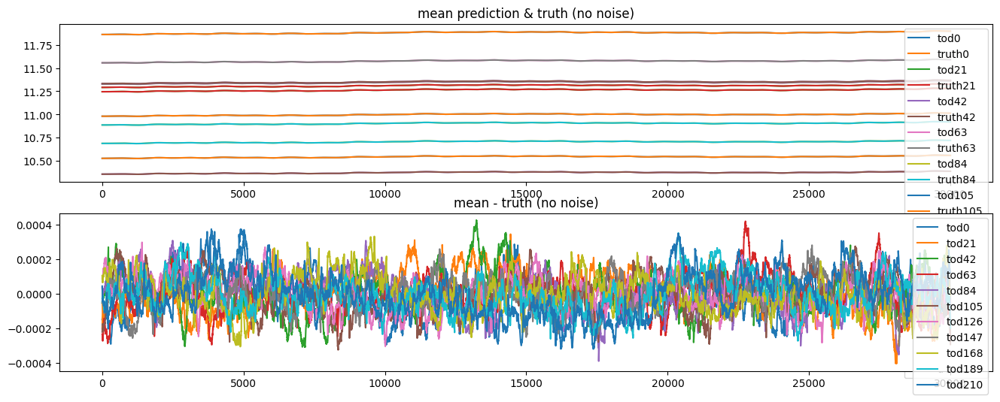

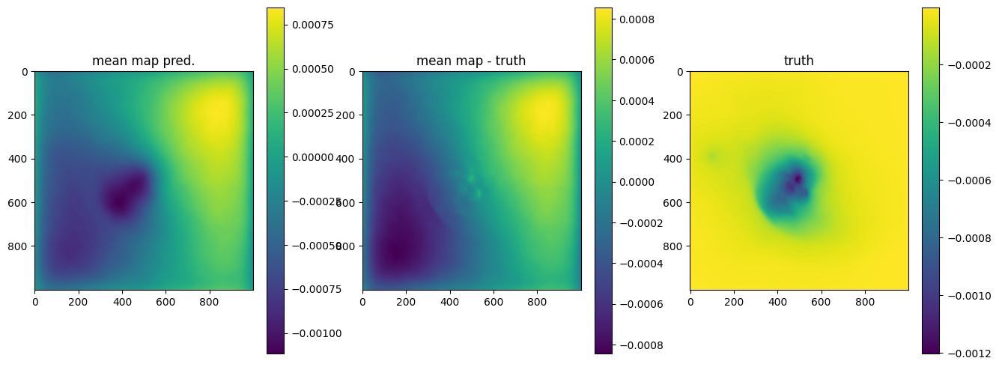

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+4.9754e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+4.8356e+08 Δ⛰:1.3980e+07 ➽:8.5950e+01
SL: Iteration 2 ⛰:+4.7263e+08 Δ⛰:1.0930e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+8.5358e+07 Δ⛰:3.8727e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+5.7598e+07 Δ⛰:2.7760e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+2.3362e+07 Δ⛰:3.4235e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+1.8557e+07 Δ⛰:4.8050e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+1.8494e+07 Δ⛰:6.3884e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.4821e+07 Δ⛰:3.6724e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+9.3276e+06 Δ⛰:5.4937e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+9.1048e+06 Δ⛰:2.2276e+05 ➽:8.5950e+01
SL: Iteration 11 ⛰:+7.8070e+06 Δ⛰:1.2978e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+6.2837e+06 Δ⛰:1.5233e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+6.2807e+06 Δ⛰:3.0057e+03 ➽:8.5950e+01
SL: Iteration 14 ⛰:+4.8357e+06 Δ⛰:1.4450e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+4.0627e+06 Δ⛰:7.7294e+05 ➽:8.5950e+01
SL: Iteration 16 ⛰:+2.7052e+06 Δ⛰:1.3575e+06 ➽:8.5950e+01
SL: 

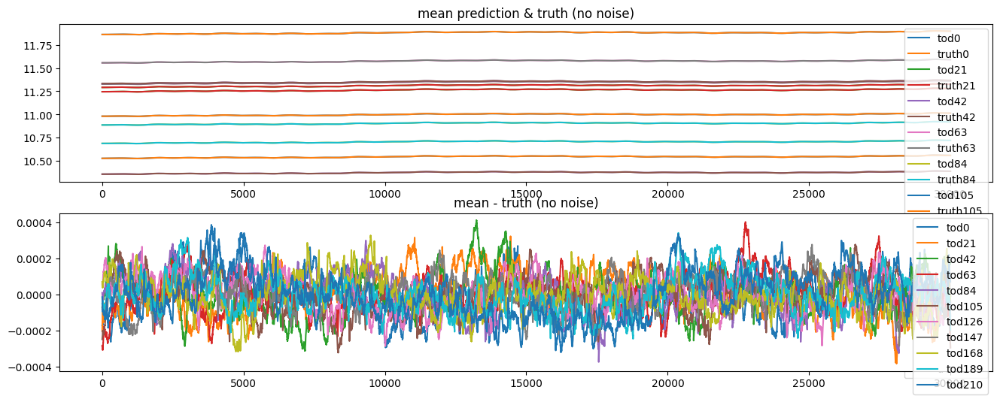

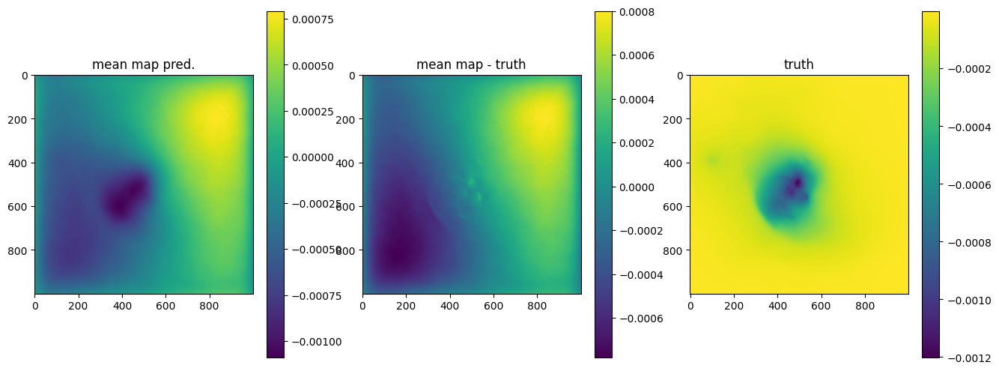

OPTIMIZE_KL: Starting 0014
SL: Iteration 0 ⛰:+2.0564e+09 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+6.0826e+08 Δ⛰:1.4481e+09 ➽:8.5950e+01
SL: Iteration 2 ⛰:+5.5013e+08 Δ⛰:5.8139e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+8.9600e+07 Δ⛰:4.6053e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+6.1765e+07 Δ⛰:2.7835e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+2.4461e+07 Δ⛰:3.7304e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+1.5858e+07 Δ⛰:8.6030e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+1.5686e+07 Δ⛰:1.7123e+05 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.1747e+07 Δ⛰:3.9389e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+1.0760e+07 Δ⛰:9.8762e+05 ➽:8.5950e+01
SL: Iteration 10 ⛰:+9.5244e+06 Δ⛰:1.2355e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+7.9281e+06 Δ⛰:1.5963e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+5.8306e+06 Δ⛰:2.0975e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+5.8277e+06 Δ⛰:2.8472e+03 ➽:8.5950e+01
SL: Iteration 14 ⛰:+5.2355e+06 Δ⛰:5.9223e+05 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.9606e+06 Δ⛰:3.2749e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.8096e+06 Δ⛰:1.5100e+05 ➽:8.5950e+01
SL: 

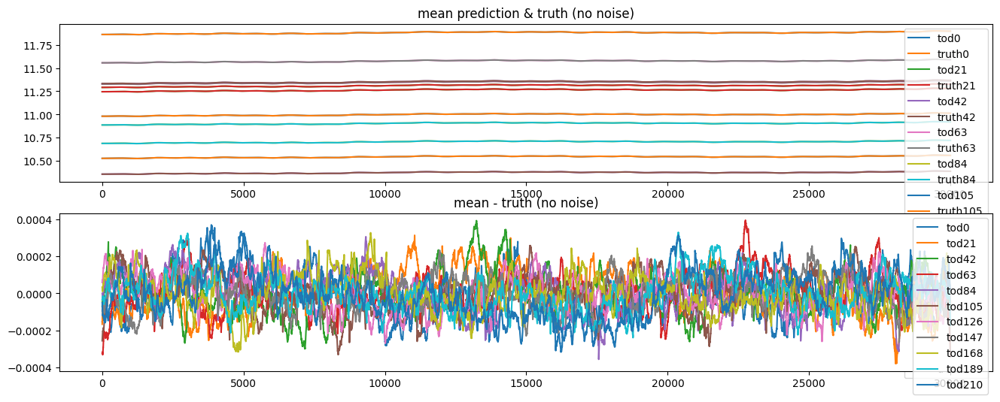

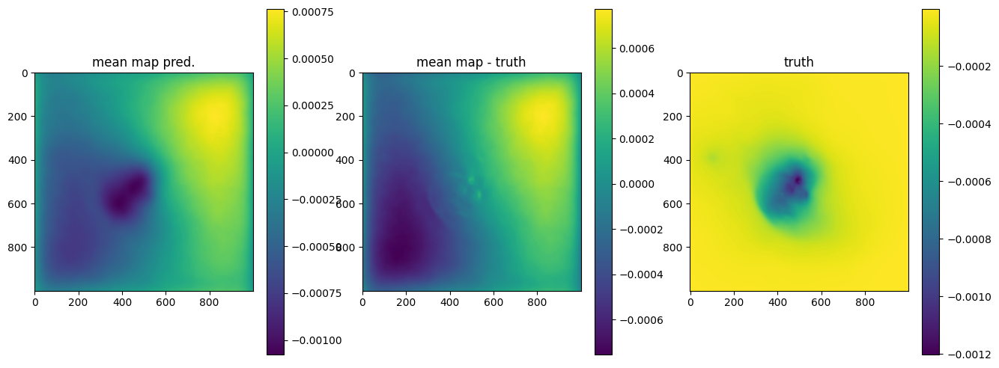

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+7.8355e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+7.1920e+08 Δ⛰:6.4356e+07 ➽:8.5950e+01
SL: Iteration 2 ⛰:+6.4673e+08 Δ⛰:7.2470e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+1.0545e+08 Δ⛰:5.4128e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+7.3649e+07 Δ⛰:3.1798e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+2.8614e+07 Δ⛰:4.5035e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+2.0491e+07 Δ⛰:8.1232e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+2.0276e+07 Δ⛰:2.1455e+05 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.5882e+07 Δ⛰:4.3946e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+1.1638e+07 Δ⛰:4.2435e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+1.1300e+07 Δ⛰:3.3828e+05 ➽:8.5950e+01
SL: Iteration 11 ⛰:+9.9352e+06 Δ⛰:1.3646e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+7.5572e+06 Δ⛰:2.3780e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+6.8099e+06 Δ⛰:7.4731e+05 ➽:8.5950e+01
SL: Iteration 14 ⛰:+6.7675e+06 Δ⛰:4.2361e+04 ➽:8.5950e+01
SL: Iteration 15 ⛰:+4.5355e+06 Δ⛰:2.2320e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+2.7181e+06 Δ⛰:1.8175e+06 ➽:8.5950e+01
SL: 

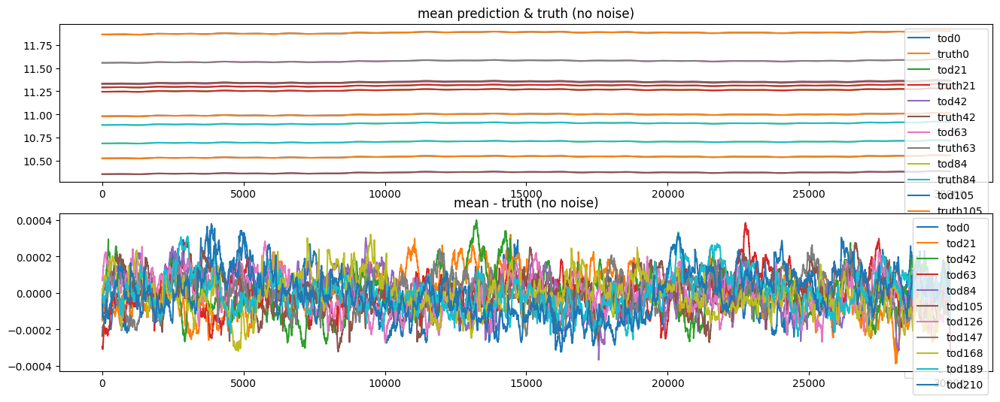

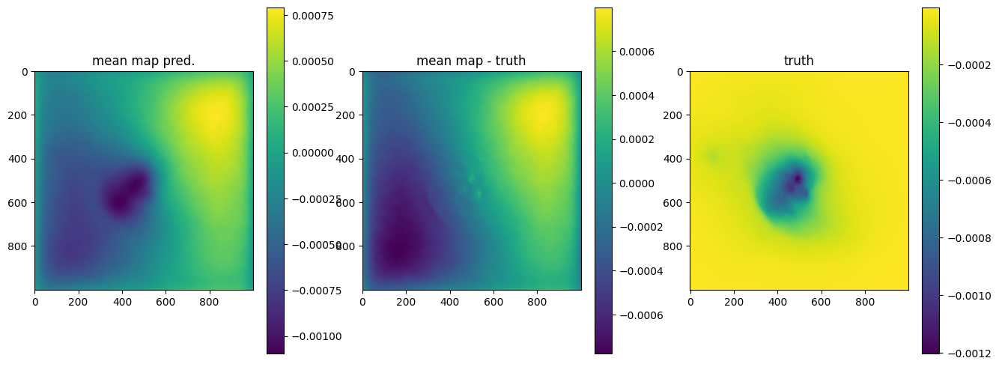

OPTIMIZE_KL: Starting 0016
SL: Iteration 0 ⛰:+1.0358e+09 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+5.5582e+08 Δ⛰:4.8002e+08 ➽:8.5950e+01
SL: Iteration 2 ⛰:+4.7329e+08 Δ⛰:8.2530e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+8.8351e+07 Δ⛰:3.8494e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+6.0448e+07 Δ⛰:2.7902e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+2.3206e+07 Δ⛰:3.7242e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+1.9712e+07 Δ⛰:3.4942e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+1.7889e+07 Δ⛰:1.8224e+06 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.1115e+07 Δ⛰:6.7742e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+1.0186e+07 Δ⛰:9.2877e+05 ➽:8.5950e+01
SL: Iteration 10 ⛰:+8.8226e+06 Δ⛰:1.3639e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+7.1360e+06 Δ⛰:1.6865e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+5.2880e+06 Δ⛰:1.8480e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+5.1436e+06 Δ⛰:1.4441e+05 ➽:8.5950e+01
SL: Iteration 14 ⛰:+4.6184e+06 Δ⛰:5.2521e+05 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.7709e+06 Δ⛰:2.8476e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.3007e+06 Δ⛰:4.7017e+05 ➽:8.5950e+01
SL: 

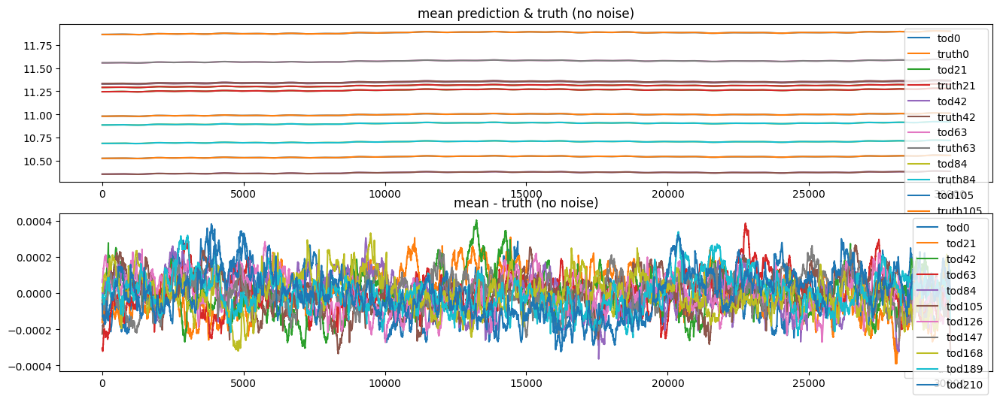

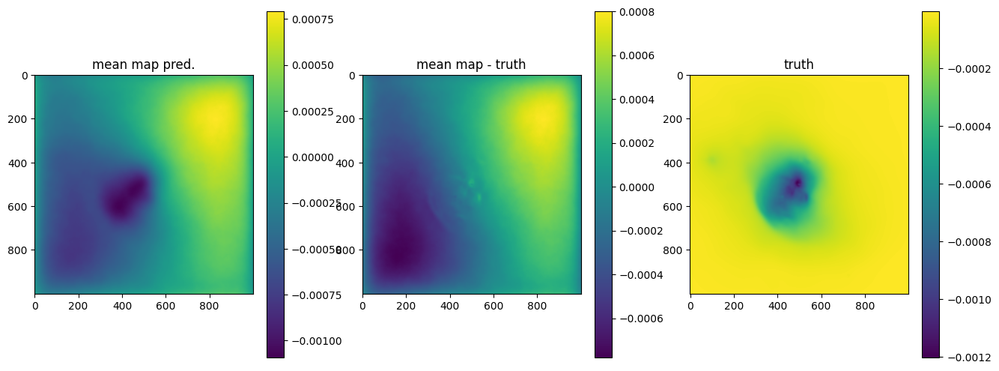

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+3.7690e+09 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+4.4208e+08 Δ⛰:3.3269e+09 ➽:8.5950e+01
SL: Iteration 2 ⛰:+3.8458e+08 Δ⛰:5.7505e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+7.4466e+07 Δ⛰:3.1011e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+5.0395e+07 Δ⛰:2.4071e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+1.9904e+07 Δ⛰:3.0491e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+1.7414e+07 Δ⛰:2.4900e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+1.7116e+07 Δ⛰:2.9756e+05 ➽:8.5950e+01
SL: Iteration 8 ⛰:+9.6435e+06 Δ⛰:7.4729e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+9.5942e+06 Δ⛰:4.9232e+04 ➽:8.5950e+01
SL: Iteration 10 ⛰:+7.2317e+06 Δ⛰:2.3625e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+6.0346e+06 Δ⛰:1.1971e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+4.5588e+06 Δ⛰:1.4758e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+4.2677e+06 Δ⛰:2.9108e+05 ➽:8.5950e+01
SL: Iteration 14 ⛰:+3.4955e+06 Δ⛰:7.7226e+05 ➽:8.5950e+01
SL: Iteration 15 ⛰:+2.5868e+06 Δ⛰:9.0868e+05 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.4080e+06 Δ⛰:1.1788e+06 ➽:8.5950e+01
SL: 

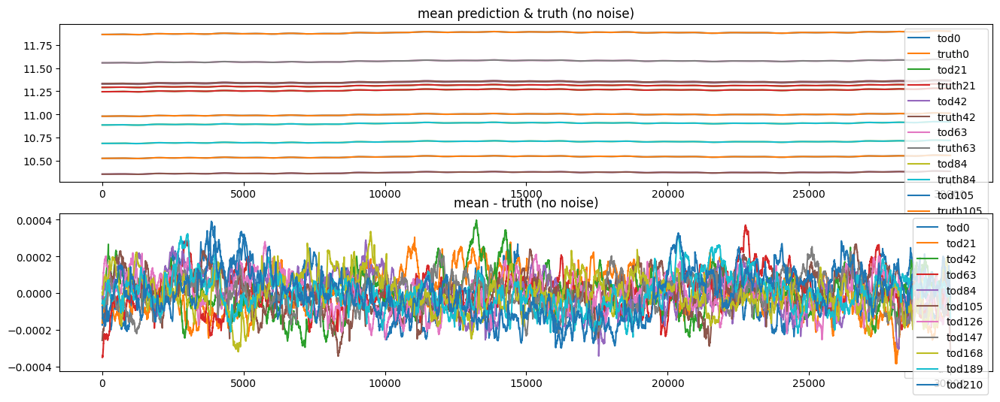

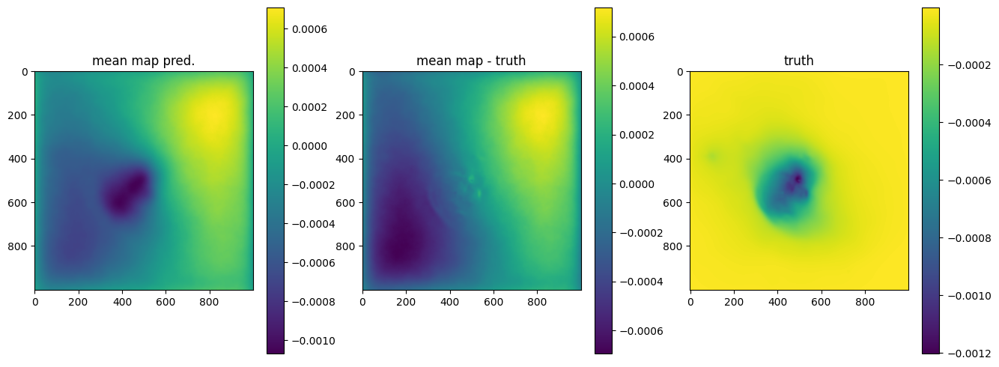

OPTIMIZE_KL: Starting 0018
SL: Iteration 0 ⛰:+7.7166e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+5.1029e+08 Δ⛰:2.6138e+08 ➽:8.5950e+01
SL: Iteration 2 ⛰:+4.9793e+08 Δ⛰:1.2352e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+8.7930e+07 Δ⛰:4.1000e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+6.0448e+07 Δ⛰:2.7483e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+2.2524e+07 Δ⛰:3.7924e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+1.6425e+07 Δ⛰:6.0987e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+1.6386e+07 Δ⛰:3.8906e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.0451e+07 Δ⛰:5.9350e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+8.9871e+06 Δ⛰:1.4643e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+8.9743e+06 Δ⛰:1.2734e+04 ➽:8.5950e+01
SL: Iteration 11 ⛰:+6.3828e+06 Δ⛰:2.5915e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+5.0835e+06 Δ⛰:1.2994e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+5.0684e+06 Δ⛰:1.5034e+04 ➽:8.5950e+01
SL: Iteration 14 ⛰:+3.8859e+06 Δ⛰:1.1825e+06 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.8666e+06 Δ⛰:2.0194e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+1.3874e+06 Δ⛰:4.7921e+05 ➽:8.5950e+01
SL: 

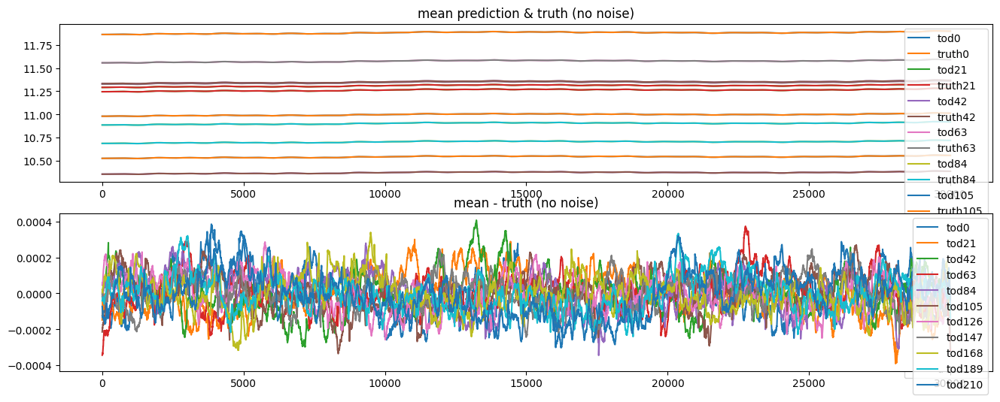

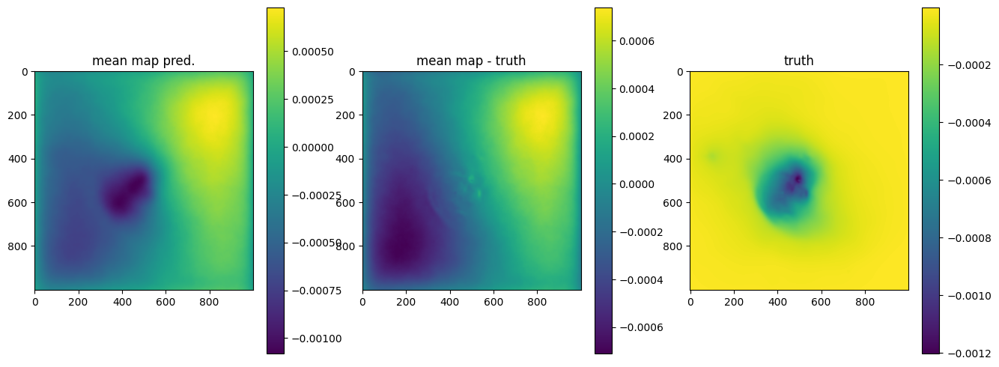

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+5.6837e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+5.0057e+08 Δ⛰:6.7805e+07 ➽:8.5950e+01
SL: Iteration 2 ⛰:+4.9042e+08 Δ⛰:1.0147e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+7.7623e+07 Δ⛰:4.1280e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+5.2364e+07 Δ⛰:2.5258e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+1.8798e+07 Δ⛰:3.3566e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+1.3710e+07 Δ⛰:5.0883e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+1.3081e+07 Δ⛰:6.2887e+05 ➽:8.5950e+01
SL: Iteration 8 ⛰:+9.1849e+06 Δ⛰:3.8959e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+7.9133e+06 Δ⛰:1.2716e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+6.4323e+06 Δ⛰:1.4810e+06 ➽:8.5950e+01
SL: Iteration 11 ⛰:+5.4712e+06 Δ⛰:9.6112e+05 ➽:8.5950e+01
SL: Iteration 12 ⛰:+4.1155e+06 Δ⛰:1.3557e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+4.0838e+06 Δ⛰:3.1629e+04 ➽:8.5950e+01
SL: Iteration 14 ⛰:+3.4149e+06 Δ⛰:6.6890e+05 ➽:8.5950e+01
SL: Iteration 15 ⛰:+2.5132e+06 Δ⛰:9.0172e+05 ➽:8.5950e+01
SL: Iteration 16 ⛰:+8.1253e+05 Δ⛰:1.7007e+06 ➽:8.5950e+01
SL: 

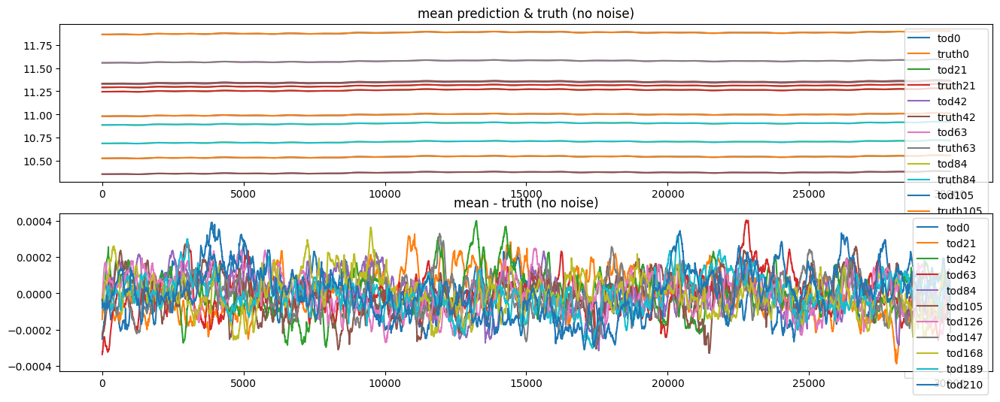

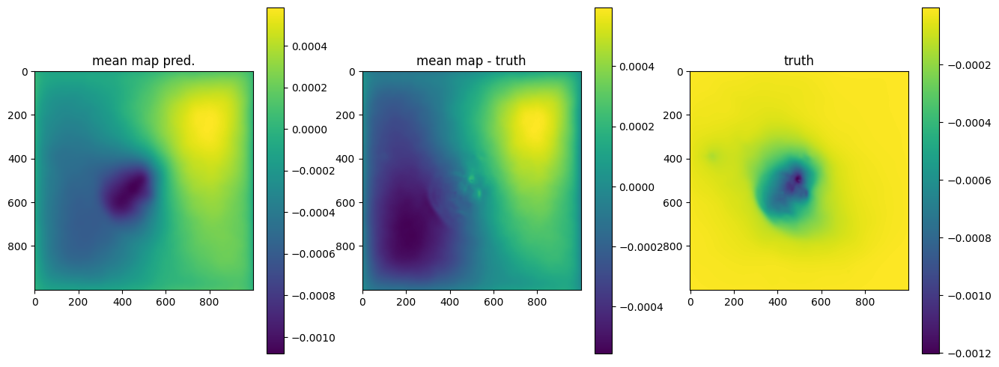

OPTIMIZE_KL: Starting 0020
SL: Iteration 0 ⛰:+6.5939e+08 Δ⛰:inf ➽:8.5950e+01
SL: Iteration 1 ⛰:+6.0043e+08 Δ⛰:5.8952e+07 ➽:8.5950e+01
SL: Iteration 2 ⛰:+5.6813e+08 Δ⛰:3.2305e+07 ➽:8.5950e+01
SL: Iteration 3 ⛰:+9.1412e+07 Δ⛰:4.7672e+08 ➽:8.5950e+01
SL: Iteration 4 ⛰:+6.3253e+07 Δ⛰:2.8159e+07 ➽:8.5950e+01
SL: Iteration 5 ⛰:+2.2729e+07 Δ⛰:4.0524e+07 ➽:8.5950e+01
SL: Iteration 6 ⛰:+1.6964e+07 Δ⛰:5.7651e+06 ➽:8.5950e+01
SL: Iteration 7 ⛰:+1.6917e+07 Δ⛰:4.6966e+04 ➽:8.5950e+01
SL: Iteration 8 ⛰:+1.2532e+07 Δ⛰:4.3847e+06 ➽:8.5950e+01
SL: Iteration 9 ⛰:+8.3897e+06 Δ⛰:4.1426e+06 ➽:8.5950e+01
SL: Iteration 10 ⛰:+7.6882e+06 Δ⛰:7.0151e+05 ➽:8.5950e+01
SL: Iteration 11 ⛰:+6.3246e+06 Δ⛰:1.3636e+06 ➽:8.5950e+01
SL: Iteration 12 ⛰:+4.8328e+06 Δ⛰:1.4918e+06 ➽:8.5950e+01
SL: Iteration 13 ⛰:+4.8310e+06 Δ⛰:1.8205e+03 ➽:8.5950e+01
SL: Iteration 14 ⛰:+4.3769e+06 Δ⛰:4.5411e+05 ➽:8.5950e+01
SL: Iteration 15 ⛰:+1.9852e+06 Δ⛰:2.3916e+06 ➽:8.5950e+01
SL: Iteration 16 ⛰:+9.7993e+05 Δ⛰:1.0053e+06 ➽:8.5950e+01
SL: 

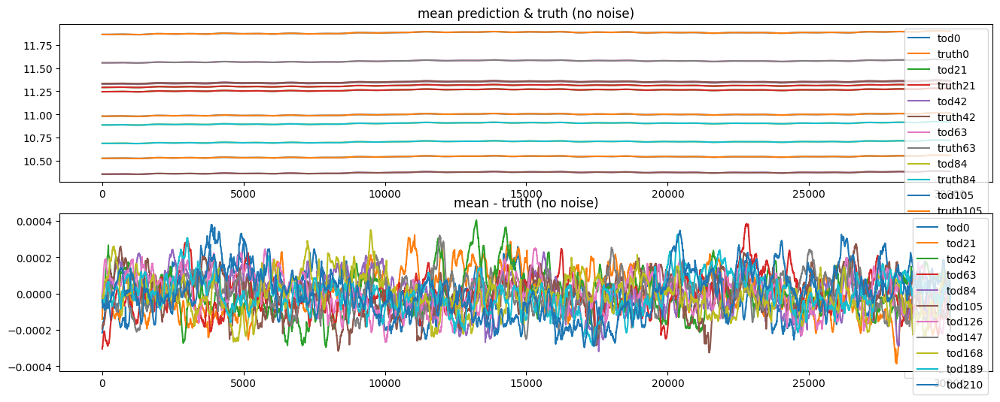

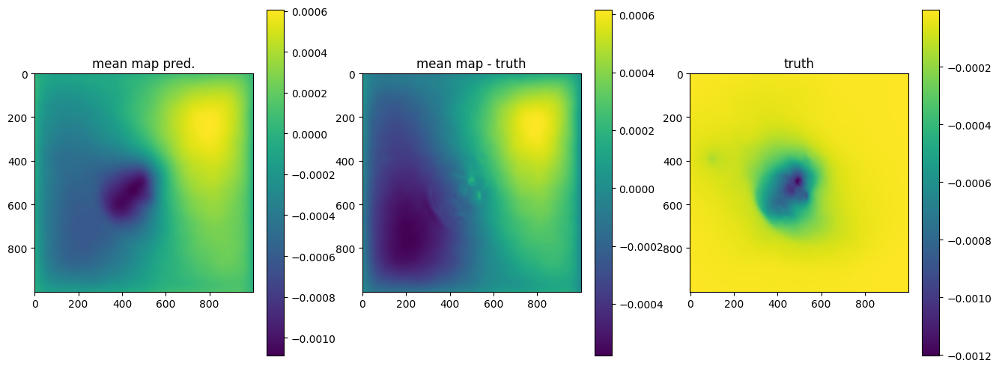

In [29]:
n_it = 20
# n_it = 30
# n_it = 50

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    # for i in range(0, mean.shape[0], mean.shape[0]//10):
    # for i in range(n):
    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('mean prediction & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean - truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=10),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=10
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [38]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.003161262037585366, 0.002, 0.001
	loglogvarslope: -2.842047736369864, -2.5, 0.5
	zeromode std (LogNormal): 0.00011776495069513501, 0.002, 0.001
map:
	fluctuations: 3.205845523930888e-05, 4.5e-05, 2e-05
	loglogvarslope: -3.443601445722148, -2.5, 0.5
	zeromode std (LogNormal): 1.0532265761380043e-09, 1e-08, 1e-07


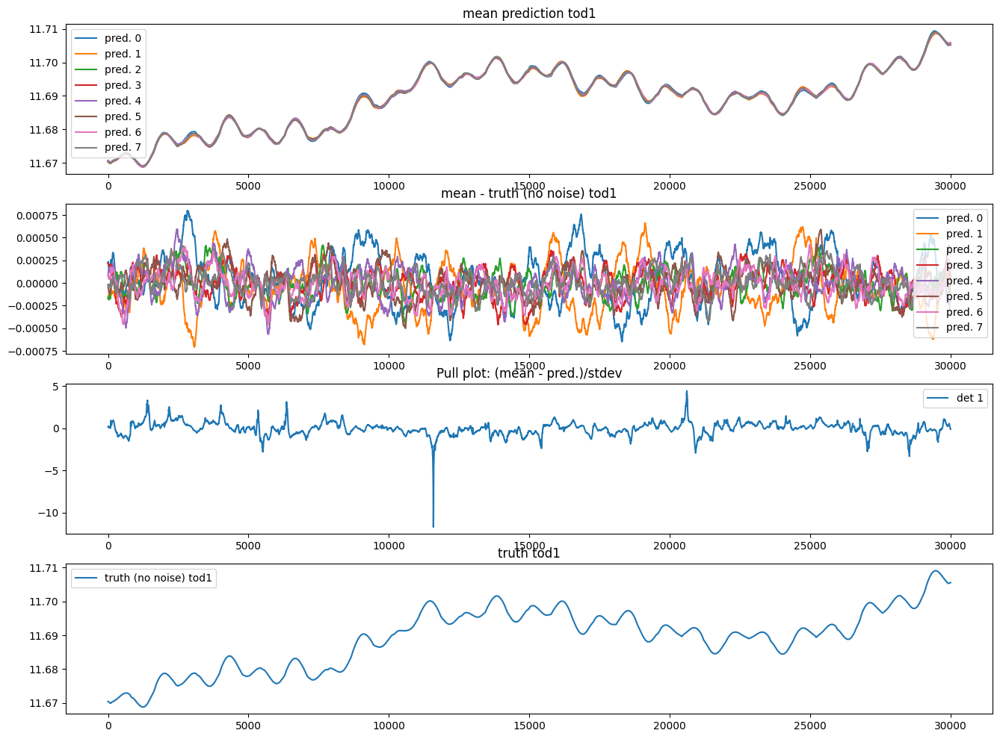

In [ ]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

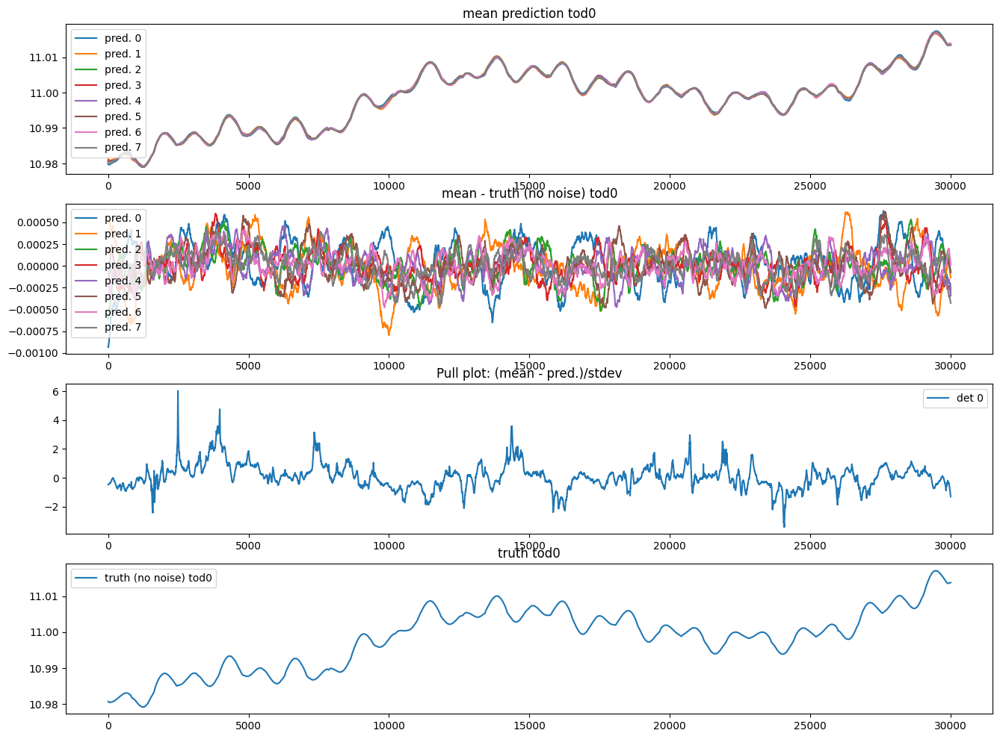

In [ ]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 0 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [33]:
from maria.map.mappers import BinMapper

mapper = BinMapper(center=(150, 10),
                   frame="ra_dec",
                   width=0.1,
                   height=0.1,
                   resolution=2e-4,
                   tod_preprocessing={
                        "window": {"tukey": {"alpha": 0.1}},
                        "remove_modes": {"n": 1},
                        "filter": {"f_lower": 0.01},
                        "despline": {"knot_spacing": 5},
                                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                                    },
                   units="K_RJ",
                   tods=[tod_truthmap],
                   )

output_map = mapper.run()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


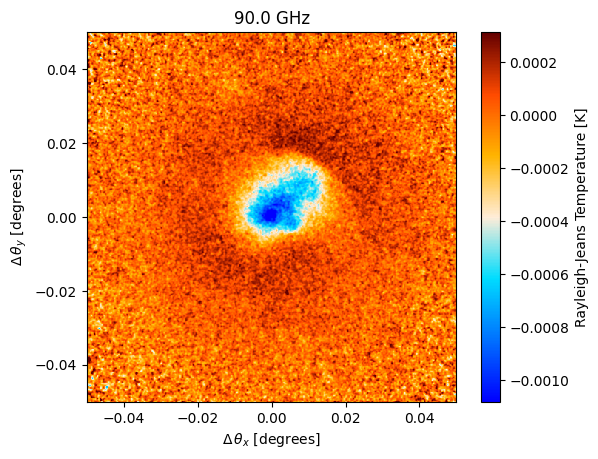

In [34]:
output_map.plot()

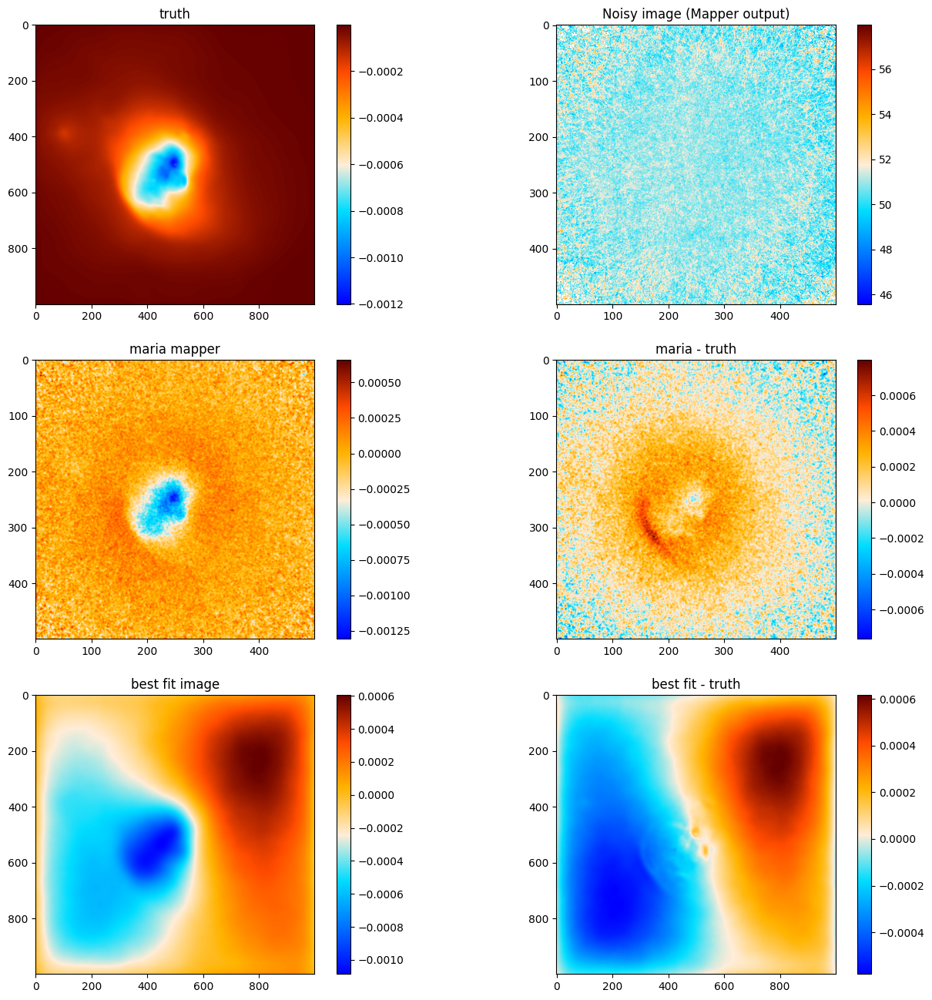

In [35]:
from skimage.transform import resize

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0], (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()